### <p style="background-color:#627D50;color:#D1CABD;font-size:110%;text-align:center;border-radius:20px 60px;  border: 10px solid #cfcfcf;  padding-top: 10px;  padding-left: 10px;  padding-right: 10px; padding-bottom: 10px;  border-radius: 80px 20px;line-height: 1.2em; margin-bottom: 10px;"> **Projet 7** : Implémentez un modèle de scoring </p>

<img src="pret_depenser.png" align="right" alt="Alternative text" />

La société financière, nommée **"Prêt à dépenser"**, propose des crédits à la consommation pour des
personnes ayant peu ou pas du tout d'historique de prêt.

L’entreprise souhaite mettre en œuvre **un outil de “scoring crédit”** pour calculer la qu’un client
rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc
développer **un algorithme de classification** en s’appuyant sur des sources de données variées (données
comportementales, données provenant d'autres institutions financières, etc.)

*************************
- Mentor [**Babou M'BAYE**]()
- Etudiant [**Bourama FANE**](https://www.linkedin.com/in/bourama-fan%C3%A9-7aba41141/)
- Parcours [*Data Scientist*]()
- Ecole [*OpenClassrooms*](https://openclassrooms.com/fr)
- Date : [Aout 2023]()

### <font color="#337da4" id="contexte">Mission </font>
----------------------------


1. [x] Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
2. [x] Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.
3. [x] Mettre en production le modèle de scoring de prédiction à l’aide d’une API, ainsi que le dashboard interactif qui appelle l’API pour les prédictions.

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

### <font color="#337da4" id="lib">Librairies </font>
----------------------------

In [2]:
# # --- Installing Libraries ---
# !pip install pandas-profiling==3.2.0
# !pip install pywaffle

In [3]:
import os
import pandas as pd
import numpy as np
import datetime, time
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# !pip install dataframe_to_image
import dataframe_image as dfi

# date
from datetime import time
import phik

from lightgbm import LGBMClassifier

# Plotly
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Suppress FutureWarnings related to is_categorical_dtype
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")


class clr:
    start = '\033[93m' + '\033[1m'
    color = '\033[93m'
    end = '\033[0m'

In [4]:
import sys
def is_colab_environment():
    # Vérifier si le module 'google.colab' est présent dans la liste des modules importés
    return 'google.colab' in sys.modules

# Exemple d'utilisation
if is_colab_environment():
    print("Le code s'exécute dans l'environnement Google Colab.")
else:
    print("Le code s'exécute dans un environnement local.")

if is_colab_environment():
    from google.colab import drive
    drive.mount('/content/drive')

Le code s'exécute dans un environnement local.


In [5]:
# def os_make_dir(folder):
#     if not os.path.exists(folder):
#         os.makedirs(folder)
# def os_path_join(folder, file):
#     """Remplacement pour `os.path.join(folder, file)` sur Windows"""
#     return f'{folder}/{file}'

In [6]:
from  function_EDA import *

Le code s'exécute dans un environnement local.


In [7]:
# # Configuration des chemins de dossiers pour les différents environnements
# if not is_colab_environment():
#     PROJ_FOLDER   =  'C:/Users/Fane0763/OpenClassroom/OC Projet 7'
#     DATA_FOLDER   =  os_path_join(PROJ_FOLDER,'bases')
#     OUT_FOLDER    =  os_path_join(PROJ_FOLDER,'out_put')
#     GRAPH_FOLDER  =  os_path_join(PROJ_FOLDER,'Graphs') # graphique pour les diapos

    
# # Définition des chemins de dossiers pour l'environnement Colab
# if is_colab_environment():
#     # Colaboratory - décommentez les 2 lignes suivantes pour connecter à votre drive
#     # from google.colab import drive
#     # drive.mount('/content/drive')
#     PROJ_FOLDER   = '/content/drive/MyDrive/OC-Projet-7'
#     DATA_FOLDER   =  os_path_join(PROJ_FOLDER,'bases')
#     OUT_FOLDER    =  os_path_join(PROJ_FOLDER,'out_put')
#     GRAPH_FOLDER  =  os_path_join(PROJ_FOLDER,'Graphs') # graphique pour les diapos
    
    
# SAVE_IMAGES = True
# # imgPath = f'{DATA_FOLDER}/Graphs'
# # if not os.path.exists(imgPath[:-1]):
# #     os.makedirs(imgPath[:-1])

# Crée les dossiers spécifiés s'ils n'existent pas déjà
os_make_dir(OUT_FOLDER)
os_make_dir(GRAPH_FOLDER)  # graphique pour les diapos
imgPath=f'{GRAPH_FOLDER}/'
print(GRAPH_FOLDER) 

# Données nettoyés (OUT_FOLDER)
CLEAN_DATA_FILENAME = 'cleaned_data_scoring.csv'
CLEAN_DATA_SAMPLE   = 'cleaned_data_sample.csv'  # 100,000 registres
CLEAN_DATA_TRAIN    = 'cleaned_data_train.csv'  
CLEAN_DATA_TEST     = 'cleaned_data_test.csv'  
CLEAN_DATA_FEATURES = 'cleaned_data_features.csv'  # 100 meilleur features
SAMPLE_SIZE         = 10000

os.listdir(DATA_FOLDER)[:5]

C:/Users/Fane0763/OpenClassroom/OC Projet 7/Graphs


['application_test.csv',
 'application_train.csv',
 'bureau.csv',
 'bureau_balance.csv',
 'credit_card_balance.csv']

In [8]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## Sommaire

<a style="color: #337da4;" href='#1'> <h5> 1 - Jeu de données </h5>  </a>  
> <a href='#3.1'>1.1 - Listes des fichiers </a>   
> <a href='#3.2'>1.2 - Description </a>      
> <a href='#3.3'>1.3 - Chargement des bases </a>  
    
> <a href='#2'>2 - Chargement des jeux de données </a> 

> <a href='#3'>3 - Exploration des jeux de données </a>   
    >> <a href='#3.1'>3.1 - Données pays (dfCountry) </a>   
    >> <a href='#3.2'>3.2 - Données Series (dfSeries) </a>      
    >> <a href='#3.3'>3.3 - Données Country Series (dfCountrySeries) </a>  
    >> <a href='#3.3'>3.4 - Données Data (dfData) </a>     
    >> <a href='#3.3'>3.5 - Données FootNote (dfFootNote) </a> 

### <a style="color: #337da4;" id='1'> 1 - Jeu de données </a>
------------------------

#### <a style="color: #337da4;" id='1.1'> 1.1 - Listes des fichiers </a>   

In [9]:
bases_list=list_files_and_sizes(DATA_FOLDER)
bases_list

,File Name,File Size
0,application_test.csv,25.34 Mo
1,application_train.csv,158.44 Mo
2,bureau.csv,162.14 Mo
3,bureau_balance.csv,358.19 Mo
4,credit_card_balance.csv,404.91 Mo
5,HomeCredit_columns_description.csv,36.51 ko
6,installments_payments.csv,689.62 Mo
7,POS_CASH_balance.csv,374.51 Mo
8,previous_application.csv,386.21 Mo
9,sample_submission.csv,523.63 ko


#### <a style="color: #337da4;" id='1.2'> 1.2 - Description & shema </a>    

| Fichier | Description |
| --- | --- |
|  <p style='text-align: justify;'>**application_train/application_test**|  <ul style='text-align: justify;'><li> Les principales données de train et de test avec des informations sur chaque demande de prêt chez Home Credit. Chaque prêt a sa propre ligne et est identifié par la caractéristique **SK_ID_CURR**.</li> <li> Les données de train sont accompagnées de la caractéristique **TARGET** indiquant 0 : le prêt a été remboursé ou 1 : le prêt n'a pas été remboursé</li></ul> |    
|  <p style='text-align: justify;'>**bureau.csv** |  <ul style='text-align: justify;'><li>Tous les crédits précédents du client fournis par d'autres institutions financières qui ont été rapportés au Credit Bureau (pour les clients qui ont un prêt dans notre échantillon). </li> <li> Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande</li></ul> |    
| <p style='text-align: justify;'>**bureau_balance.csv** | <ul style='text-align: justify;'><li>Soldes mensuels des crédits précédents dans Credit Bureau. </li> <li> Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent rapporté au Credit Bureau - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) des lignes.</li></ul> |
| <p style='text-align: justify;'>**POS_CASH_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des prêts POS (point of sales) et cash précédents que le demandeur a eu avec Home Credit. </li> <li> Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent au Home Credit (crédit à la consommation et prêts au comptant) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (# de prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lesquels nous avons un historique observable pour les crédits précédents) lignes.</li></ul> |
| <p style='text-align: justify;'>**credit_card_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des cartes de crédit précédentes que le demandeur possède chez Home Credit. </li> <li>  Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent dans le Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.</li></ul>|
| <p style='text-align: justify;'>**previous_application.csv** | <ul style='text-align: justify;'><li>Toutes les demandes précédentes de prêts pour le crédit immobilier des clients qui ont des prêts dans notre échantillon. </li> <li> Il y a une ligne pour chaque demande antérieure liée aux prêts dans notre échantillon de données.</li></ul> |
| <p style='text-align: justify;'>**installments_payments.csv** | <ul style='text-align: justify;'><li>Historique des remboursements pour les crédits précédemment déboursés dans Home Credit liés aux prêts de notre échantillon. </li> <li>  Il y a a) une ligne pour chaque paiement qui a été effectué plus b) une ligne pour chaque paiement manqué. Une ligne équivaut à un paiement d'un versement OU à un versement correspondant à un paiement d'un crédit précédent de Home Credit lié aux prêts de notre échantillon.</li></ul> |

<img src='https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png'>

#### <a style="color: #337da4;" id='1.3'> 1.3 - Chargement des bases </a> 

In [10]:
import chardet
def detect_encoding(file_path):
    with open(file_path, 'rb') as f:
        result = chardet.detect(f.read())
    return result['encoding']

def get_dataframe_name(df):
    name = [x for x in globals() if globals()[x] is df]
    return name[0]


def namestr(df, namespace=globals()):
    name = [name for name in namespace if namespace[name] is df]
    return name[0] if name else None  # Return the first name or None if not found

In [11]:
from tqdm import tqdm

def load_csv_files_as_dataframes(directory_path):
    dataframes={}
    listedf=[]
    with tqdm(total=len(os.listdir(directory_path)), desc='Chargement...', unit='file') as pbar:
        for r, filename in enumerate(os.listdir(directory_path)):
            # print(r)
            if filename.endswith(".csv"):
                csv_path = os.path.join(directory_path, filename)            
                df_name = os.path.splitext(filename)[0]  # Nom du dataframe (sans extension)
                listedf.append(df_name)
                encoding = detect_encoding(csv_path)
                globals()[df_name] = pd.read_csv(csv_path, encoding=encoding)  # Charger le fichier CSV en tant que dataframe
                dataframes[df_name] = globals()[df_name]
                pbar.update(1)

    return dataframes, listedf

In [12]:
datasets, titles=load_csv_files_as_dataframes(DATA_FOLDER)

Chargement...: 100%|█████████████████████████████████████████████████████████████████| 10/10 [00:38<00:00,  3.88s/file]


In [13]:
titles

['application_test',
 'application_train',
 'bureau',
 'bureau_balance',
 'credit_card_balance',
 'HomeCredit_columns_description',
 'installments_payments',
 'POS_CASH_balance',
 'previous_application',
 'sample_submission']

In [14]:
datasets=[application_test, application_train, bureau, bureau_balance, credit_card_balance,
          HomeCredit_columns_description, installments_payments, POS_CASH_balance, 
          previous_application]


BaseNameString=[namestr(data, namespace=globals()) for data in datasets]
print(BaseNameString)
    
# description=apercu(datasets, BaseNameString)
# description2=apercu2(datasets, BaseNameString)
# dfi.export(description2, imgPath+'datasets.png')
# description

['application_test', 'application_train', 'bureau', 'bureau_balance', 'credit_card_balance', 'HomeCredit_columns_description', 'installments_payments', 'POS_CASH_balance', 'previous_application']


In [15]:
os.listdir(DATA_FOLDER)

dict_df = {}
bases   = []

for file_name in os.listdir(DATA_FOLDER):
    if file_name[-4:]        == '.csv':
        file_path            = os_path_join(DATA_FOLDER, file_name)
        encoding             = detect_encoding(file_path)
        tabname              = file_name[:-4]  #  #.rsplit('_', 1)[0]).split('_', 1)[1]
        dict_df[tabname]     = pd.read_csv(file_path, encoding=encoding)
        globals()[tabname]   = dict_df[tabname]
        bases.append(tabname)
        
bases     

['application_test',
 'application_train',
 'bureau',
 'bureau_balance',
 'credit_card_balance',
 'HomeCredit_columns_description',
 'installments_payments',
 'POS_CASH_balance',
 'previous_application',
 'sample_submission']

In [16]:
  
def get_dataframe_name(df):
    '''
    Cette fonction retourne le nom du dataframe en string
    :param df: dataframe
    :return: nom du dataframe en format string
    '''
    name =[x for x in globals() if globals()[x] is df]
    return name[0]

get_dataframe_name(application_test)

'application_test'

In [17]:
datasets=[application_test, application_train, bureau, bureau_balance, credit_card_balance,
          HomeCredit_columns_description, installments_payments, POS_CASH_balance, 
          previous_application]

# BaseNameString=['application_test', 'application_train', 'bureau', 'bureau_balance', 'credit_card_balance',
#                 'HomeCredit_columns_description', 'installments_payments', 'POS_CASH_balance',
#                 'previous_application']

BaseNameString=[namestr(data, namespace=globals()) for data in datasets]
print(BaseNameString)

['application_test', 'application_train', 'bureau', 'bureau_balance', 'credit_card_balance', 'HomeCredit_columns_description', 'installments_payments', 'POS_CASH_balance', 'previous_application']


#### <a style="color: #337da4;" id='1.4'> 1.4 - Exploration des bases </a> 

In [18]:
# description=apercu(datasets, BaseNameString)
# description2=apercu2(datasets, BaseNameString)
# dfi.export(description2, imgPath+'datasets.png')
# description2

In [19]:
def namestr(df, namespace=globals()):
    name = [name for name in namespace if namespace[name] is df]
    return name[0] if name else None  # Return the first name or None if not found

for data in datasets:
    print(f'{namestr(data):30} :', data.shape)


application_test               : (48744, 121)
application_train              : (307511, 122)
bureau                         : (1716428, 17)
bureau_balance                 : (27299925, 3)
credit_card_balance            : (3840312, 23)
HomeCredit_columns_description : (219, 5)
installments_payments          : (13605401, 8)
POS_CASH_balance               : (10001358, 8)
previous_application           : (1670214, 37)


In [20]:
import glob
import re

def data_describe(folder):
    '''Analyse des données : nombre de lignes, colonnes, valeurs manquantes et doublons.
       Comptage des types de colonnes.
       Indication de la mémoire utilisée.'''

    data_dict = {}  # Dictionnaire pour stocker les informations des fichiers

    for file in folder:
        data = pd.read_csv(file, encoding='mac_roman')
        split_parts = re.split(r'[\\/]', file)  # Divise la chaîne en utilisant '/' ou '\'
        last_part   = split_parts[-1]  # Récupère le dernier élément du résultat
        # Calcul des différentes métriques et ajout dans le dictionnaire
        data_dict[last_part] = [
            data.shape[0],  # Nombre de lignes
            data.shape[1],  # Nombre de colonnes
            round(data.isna().sum().sum() / data.size * 100, 2),  # Pourcentage de valeurs manquantes
            round(data.duplicated().sum().sum() / data.size * 100, 2),  # Pourcentage de doublons
            data.select_dtypes(include=['object']).shape[1],  # Nombre de colonnes de type 'object'
            data.select_dtypes(include=['float']).shape[1],  # Nombre de colonnes de type 'float'
            data.select_dtypes(include=['int']).shape[1],  # Nombre de colonnes de type 'int'
            data.select_dtypes(include=['bool']).shape[1],  # Nombre de colonnes de type 'bool'
            round(data.memory_usage().sum() / 1024 ** 2, 3)  # Utilisation de la mémoire en Mo
        ]
    
    # Création d'un DataFrame à partir du dictionnaire pour présenter les résultats
    comparative_table = pd.DataFrame.from_dict(
        data=data_dict,
        columns=['nb_lignes', 'nb_cols', '%missings', '%doublons',
                 'object_dtype', 'float_dtype', 'int_dtype', 'bool_dtype', 'Mo_Memory'],
        orient='index'
    )
 
    return comparative_table


# Description des données pour les fichiers CSV dans le dossier spécifié
description = data_describe(glob.glob(f'{DATA_FOLDER}/*.csv'))
description

,nb_lignes,nb_cols,%missings,%doublons,object_dtype,float_dtype,int_dtype,bool_dtype,Mo_Memory
application_test.csv,48744,121,23.81,0.0,16,65,40,0,44.998
application_train.csv,307511,122,24.40,0.0,16,65,41,0,286.227
bureau.csv,1716428,17,13.50,0.0,3,8,6,0,222.620
bureau_balance.csv,27299925,3,0.00,0.0,1,0,2,0,624.846
credit_card_balance.csv,3840312,23,6.65,0.0,1,15,7,0,673.883
HomeCredit_columns_description.csv,219,5,12.15,0.0,4,0,1,0,0.008
installments_payments.csv,13605401,8,0.01,0.0,0,5,3,0,830.408
POS_CASH_balance.csv,10001358,8,0.07,0.0,1,2,5,0,610.435
previous_application.csv,1670214,37,17.98,0.0,16,15,6,0,471.481
sample_submission.csv,48744,2,0.00,0.0,0,1,1,0,0.744


In [21]:
import pandas as pd

def features(folder):
    """
    Analyse les caractéristiques (features) des données contenues dans les fichiers CSV d'un dossier.
    
    Pour chaque fichier CSV, cette fonction extrait les caractéristiques sous forme de données
    de type objet et numérique, puis renvoie deux DataFrames :
    - df1 : Caractéristiques des colonnes de type objet (features, dtype, nan, count).
    - df2 : Caractéristiques des colonnes numériques (features, dtype, nan, count, mean, std, min, max).
    
    Args:
        folder (list): Liste des chemins vers les fichiers CSV.
        
    Returns:
        df1 (DataFrame): Caractéristiques des colonnes de type objet.
        df2 (DataFrame): Caractéristiques des colonnes numériques.
    """
    data_object = {}
    data_numeric = {}
    
    # Parcourt chaque fichier dans le dossier
    for file in folder:
        data = pd.read_csv(file, encoding='mac_roman')
        split_parts = re.split(r'[\\/]', file)  # Divise la chaîne en utilisant '/' ou '\'
        last_part   = split_parts[-1]  # Récupère le dernier élément du résultat
        # Analyse des caractéristiques pour les colonnes de type objet
        data_object[last_part] = [(x, data[x].dtype, 
                              data[x].isna().sum().sum(),
                              int(data[x].count())) for x in data.select_dtypes(exclude=['int', 'float'])]
        
        # Analyse des caractéristiques pour les colonnes numériques
        data_numeric[last_part] = [(x, data[x].dtype, 
                               int(data[x].isna().sum().sum()), 
                               int(data[x].count()), 
                               int(data[x].mean()), 
                               round(data[x].std(), 1),
                               round(data[x].min(), 1), 
                               round(data[x].max(), 1)) for x in data.select_dtypes(exclude='object')]
        
    # Création des DataFrames pour les caractéristiques
    comparative_object = pd.DataFrame.from_dict(data=data_object, orient='index')
    dict_of_object = {name: pd.DataFrame(file) for name, file in data_object.items()}
    df1 = pd.concat(dict_of_object, axis=0)
    df1.columns = ['features', 'dtype', 'nan', 'count']
    
    comparative_numeric = pd.DataFrame.from_dict(data=data_numeric, orient='index')
    dict_of_numeric = {name: pd.DataFrame(file) for name, file in data_numeric.items()}
    df2 = pd.concat(dict_of_numeric, axis=0)
    df2.columns = ['features', 'dtype', 'nan', 'count', 'mean', 'std', 'min', 'max']
        
    return df1, df2

In [22]:
#Data description
features(glob.glob(f'{DATA_FOLDER}/*.csv'))[0]

features   dtype  \
application_test.csv               0            NAME_CONTRACT_TYPE  object   
                                   1                   CODE_GENDER  object   
                                   2                  FLAG_OWN_CAR  object   
                                   3               FLAG_OWN_REALTY  object   
                                   4               NAME_TYPE_SUITE  object   
                                   5              NAME_INCOME_TYPE  object   
                                   6           NAME_EDUCATION_TYPE  object   
                                   7            NAME_FAMILY_STATUS  object   
                                   8             NAME_HOUSING_TYPE  object   
                                   9               OCCUPATION_TYPE  object   
                                   10   WEEKDAY_APPR_PROCESS_START  object   
                                   11            ORGANIZATION_TYPE  object   
                                   12           FONDKAPREMONT_MODE  object   
                                   13               HOUSETYPE_MODE  object   
                                   14           WALLSMATERIAL_MODE  object   
                                   15          EMERGENCYSTATE_MODE  object   
application_train.csv              0            NAME_CONTRACT_TYPE  object   
                                   1                   CODE_GENDER  object   
                                   2                  FLAG_OWN_CAR  object   
                                   3               FLAG_OWN_REALTY  object   
                                   4               NAME_TYPE_SUITE  object   
                                   5              NAME_INCOME_TYPE  object   
                                   6           NAME_EDUCATION_TYPE  object   
                                   7            NAME_FAMILY_STATUS  object   
                                   8             NAME_HOUSING_TYPE  object   
                                   9               OCCUPATION_TYPE  object   
                                   10   WEEKDAY_APPR_PROCESS_START  object   
                                   11            ORGANIZATION_TYPE  object   
                                   12           FONDKAPREMONT_MODE  object   
                                   13               HOUSETYPE_MODE  object   
                                   14           WALLSMATERIAL_MODE  object   
                                   15          EMERGENCYSTATE_MODE  object   
bureau.csv                         0                 CREDIT_ACTIVE  object   
                                   1               CREDIT_CURRENCY  object   
                                   2                   CREDIT_TYPE  object   
bureau_balance.csv                 0                        STATUS  object   
credit_card_balance.csv            0          NAME_CONTRACT_STATUS  object   
HomeCredit_columns_description.csv 0                         Table  object   
                                   1                           Row  object   
                                   2                   Description  object   
                                   3                       Special  object   
POS_CASH_balance.csv               0          NAME_CONTRACT_STATUS  object   
previous_application.csv           0            NAME_CONTRACT_TYPE  object   
                                   1    WEEKDAY_APPR_PROCESS_START  object   
                                   2   FLAG_LAST_APPL_PER_CONTRACT  object   
                                   3        NAME_CASH_LOAN_PURPOSE  object   
                                   4          NAME_CONTRACT_STATUS  object   
                                   5             NAME_PAYMENT_TYPE  object   
                                   6            CODE_REJECT_REASON  object   
                                   7               NAME_TYPE_SUITE  object   
                                   8              NAME_CLIENT_TYPE  object   
  

In [23]:
features(glob.glob(f'{DATA_FOLDER}/*.csv'))[1]

features    dtype     nan  \
application_test.csv     0                  SK_ID_CURR    int64       0   
                         1                CNT_CHILDREN    int64       0   
                         2            AMT_INCOME_TOTAL  float64       0   
                         3                  AMT_CREDIT  float64       0   
                         4                 AMT_ANNUITY  float64      24   
...                                                ...      ...     ...   
previous_application.csv 18              DAYS_LAST_DUE  float64  673065   
                         19           DAYS_TERMINATION  float64  673065   
                         20  NFLAG_INSURED_ON_APPROVAL  float64  673065   
sample_submission.csv    0                  SK_ID_CURR    int64       0   
                         1                      TARGET  float64       0   

                              count    mean       std       min        max  
application_test.csv     0    48744  277796  103169.5  100001.0   456250.0  
                         1    48744       0       0.7       0.0       20.0  
                         2    48744  178431  101522.6   26941.5  4410000.0  
                         3    48744  516740  365397.0   45000.0  2245500.0  
                         4    48720   29426   16016.4    2295.0   180576.0  
...                             ...     ...       ...       ...        ...  
previous_application.csv 18  997149   76582  149647.4   -2889.0   365243.0  
                         19  997149   81992  153303.5   -2874.0   365243.0  
                         20  997149       0       0.5       0.0        1.0  
sample_submission.csv    0    48744  277796  103169.5  100001.0   456250.0  
                         1    48744       0       0.0       0.5        0.5  

[288 rows x 8 columns]

In [24]:
# # --- Dataset Report ---
# from pandas_profiling import ProfileReport

# ProfileReport(application_train, title='Credit Card Dataset Report', minimal=True, progress_bar=False, 
#               samples=None, correlations=None, interactions=None, explorative=True, dark_mode=True, 
#               notebook={'iframe':{'height': '600px'}}, html={'style':{'primary_color': '#FFCC00'}}, 
#               missing_diagrams={'heatmap': False, 'dendrogram': False}).to_notebook_iframe()

#### <a style="color: #337da4;" id='1.4.1'> 1.4.1 - application_train.csv </a> 

- Le fichier application_train.csv est constituée de données statiques relatives aux emprunteurs avec des étiquettes. 
- Chaque ligne représente une demande de prêt.

In [25]:
df_var_appli_train = HomeCredit_columns_description[
    HomeCredit_columns_description['Table'].str.match('application_{train|test}.csv')]

display(df_var_appli_train)


,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
117,120,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_DAY,Number of enquiries to Credit Bureau about the...,NaN
118,121,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_WEEK,Number of enquiries to Credit Bureau about the...,NaN
119,122,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_MON,Number of enquiries to Credit Bureau about the...,NaN
120,123,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_QRT,Number of enquiries to Credit Bureau about the...,NaN


In [26]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def decrire_dataframe(df: pd.DataFrame) -> pd.DataFrame:
    """Retourner un dataframe avec des informations sur les colonnes d'un dataframe"""
    print(f'{df.shape[0]} registres', f'{df.shape[1]} colonnes')
    print(f'dtypes={df.dtypes.value_counts()}')
    ret = df.columns.to_frame(name="column").set_index('column')
    ret['% manquantes'] = df.isna().mean() * 100
    ret['unique'] = df.nunique()
    ret['dtype'] = df.dtypes
    
    # Exclure les colonnes de type non numérique de l'appel à min() et max()
    numeric_columns = df.select_dtypes(include=['number'])
    ret['min'] = numeric_columns.min()
    ret['max'] = numeric_columns.max()
    ret['std'] = numeric_columns.std()
    return ret


def list_colonnes_remplis(df: pd.DataFrame) -> list:
    """Retourne un liste de colonnes 100% remplis"""
    return df.columns[~df.isnull().any()].tolist()


def plot_bar_remplissage(df: pd.DataFrame, nb=200, titre=None, figsize=(10, 5),
                         vertical=False, filled_cols=False, thresh=50):
    """Visualise pourcent remplissage des colonnes"""
    remplissage = (round((1-df.isna().mean())*100)
                   .sort_values(ascending=False)
                   .to_frame(name='taux')
                   .rename_axis('colonne').reset_index())
    if filled_cols is False:
        remplissage = remplissage[remplissage['taux'] < 99.99]
    nb = min(nb, len(remplissage))
    remplissage = remplissage.head(nb)
    plt.figure(figsize=figsize)
    remplissage['hue'] = remplissage['taux']//7 * 7
    remplissage['hue'] = '>= ' + remplissage['hue'].astype(str)
    fontsize = 14

    if vertical:
        ax = sns.barplot(data=remplissage, y='colonne',
                         x='taux', hue='hue', dodge=False)
        ax.set_xlabel('Pourcent remplissage (%)', size=fontsize)
        ax.set_ylabel('Nom de la colonne', size=fontsize)
        ax.axvline(thresh, linestyle='--', color='red')
    else:
        ax = sns.barplot(data=remplissage, x='colonne',
                         y='taux', hue='hue', dodge=False)
        ax.set_xlabel('Nom de la colonne', size=fontsize)
        ax.set_ylabel('Pourcent remplissage (%)', size=fontsize)
        plt.xticks(rotation=90)
        ax.axhline(thresh, linestyle='--', color='red')
    if titre is None:
        titre = f'Taux de remplissage des {nb} colonnes plus remplis'
    if not filled_cols:
        titre = 'Taux de remplissage (sans colonnes 100% remplis)'
    ax.set_title(label=f'{titre} [nb={df.shape[0]}]', size=fontsize+2)
    plt.legend(title='remplissage (%)')
    sns.despine()

In [27]:
decrire_dataframe(application_train)

307511 registres 122 colonnes
dtypes=float64    65
int64      41
object     16
Name: count, dtype: int64


,% manquantes,unique,dtype,min,max,std
column,,,,,,
SK_ID_CURR,0.000000,307511,int64,100002.0,456255.0,102790.175348
TARGET,0.000000,2,int64,0.0,1.0,0.272419
NAME_CONTRACT_TYPE,0.000000,2,object,NaN,NaN,NaN
CODE_GENDER,0.000000,3,object,NaN,NaN,NaN
FLAG_OWN_CAR,0.000000,2,object,NaN,NaN,NaN
...,...,...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,13.501631,9,float64,0.0,9.0,0.110757
AMT_REQ_CREDIT_BUREAU_WEEK,13.501631,9,float64,0.0,8.0,0.204685
AMT_REQ_CREDIT_BUREAU_MON,13.501631,24,float64,0.0,27.0,0.916002


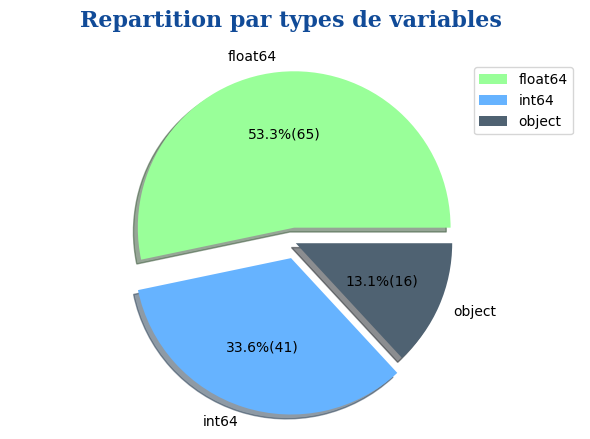

,Types de variables,Nombre
0,float64,65
1,int64,41
2,object,16


In [28]:
# Affichage des types de variables dans la base.
repartitionTypeVar(application_train,figsize=(6, 4), graphName='RepartitionTypeVar_application_train.png')

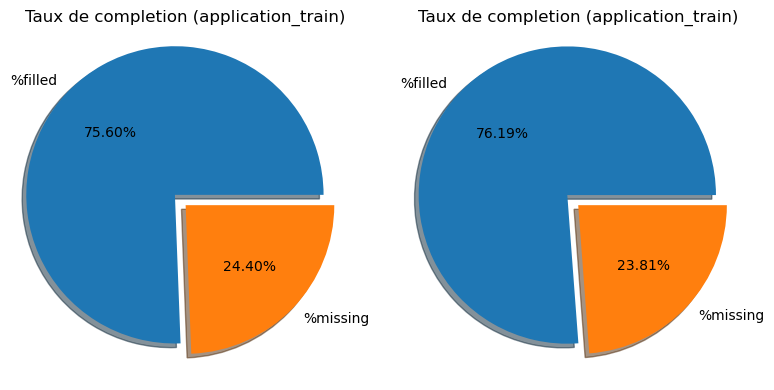

In [29]:
# fillingRate(application_train, 'tauxCompletion_application_train.png')

import pandas as pd
import matplotlib.pyplot as plt

def fillingRate2(data1: pd.DataFrame, data2: pd.DataFrame, GRAPH_FOLDER, graphName: str = None,):
    def create_pie_chart(ax, title, labels, taux):
        explode     = (0.1, 0)
        ax.axis("equal")
        ax.pie(taux, explode=explode, labels=labels, autopct='%1.2f%%', shadow=True)
        ax.set_title(title)
        
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    # fig.subplots_adjust(wspace=0.5)  # Ajustez l'espace horizontal entre les sous-graphiques
    font_title      = {'fontsize': 12}
    filled1         = data1.notna().sum().sum() / (data1.shape[0] * data1.shape[1])
    missing1        = data1.isna().sum().sum() / (data1.shape[0] * data1.shape[1])
    taux1           = [filled1, missing1]
    labels1         = ["%filled", "%missing"]
    filled2         = data2.notna().sum().sum() / (data2.shape[0] * data2.shape[1])
    missing2        = data2.isna().sum().sum() / (data2.shape[0] * data2.shape[1])
    taux2           = [filled2, missing2]
    labels2         = ["%filled", "%missing"]

    create_pie_chart(ax1, f'Taux de completion ({namestr(data1)})', labels1, taux1)
    create_pie_chart(ax2, f'Taux de completion ({namestr(data1)})', labels2, taux2)

    if graphName:
        fig.savefig(os_path_join(GRAPH_FOLDER, graphName), bbox_inches='tight')
    plt.tight_layout()  # Ajuste automatiquement l'espace entre les sous-graphiques
    plt.show()
    # to_png('Taux_completion_train_test')
    plt.close()


fillingRate2(application_train, application_test, GRAPH_FOLDER, graphName='Taux_completion_train_test.png') 

Description des variables de : None


,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
117,120,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_DAY,Number of enquiries to Credit Bureau about the...,NaN
118,121,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_WEEK,Number of enquiries to Credit Bureau about the...,NaN
119,122,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_MON,Number of enquiries to Credit Bureau about the...,NaN
120,123,application_{train|test}.csv,AMT_REQ_CREDIT_BUREAU_QRT,Number of enquiries to Credit Bureau about the...,NaN


Types de variables de : None


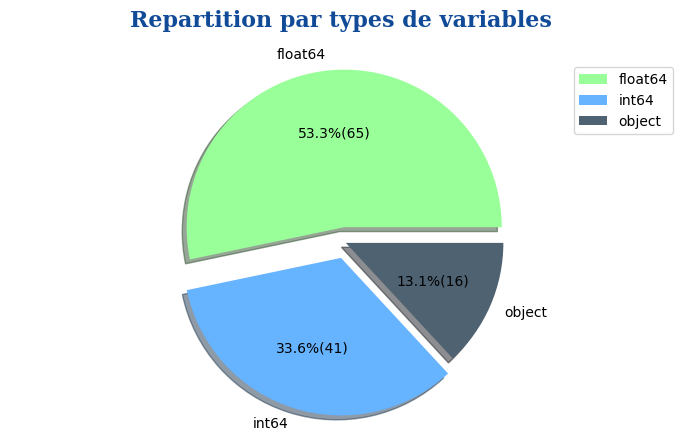

,Types de variables,Nombre
0,float64,65
1,int64,41
2,object,16


************************************************************************************************************************
Taux de complétion de : None
************************************************************************************************************************


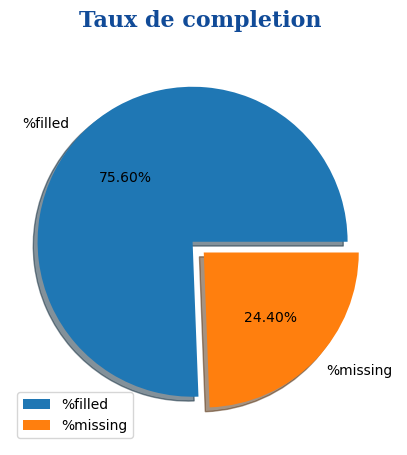

************************************************************************************************************************
Heatmap des valeurs manquantes : None
************************************************************************************************************************
************************************************************************************************************************
Réprésentation visuelle des valeurs manquantes : None
************************************************************************************************************************
Nombre de variables avec valeurs manquantes : 67


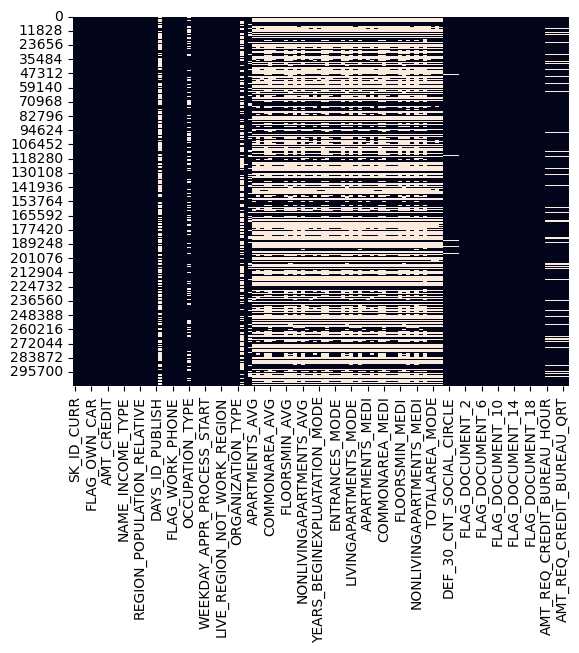

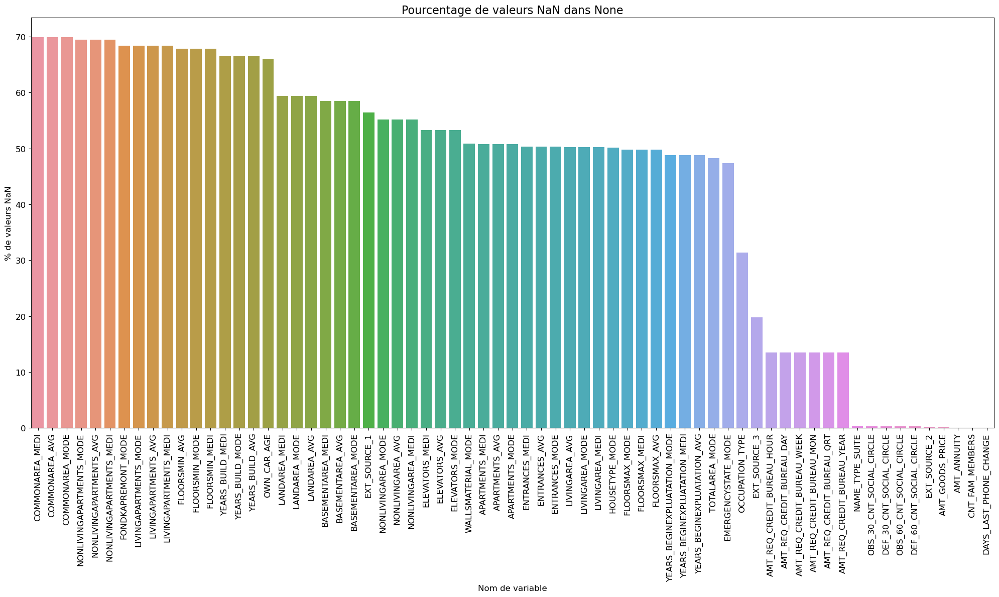

In [30]:
exploration_dataframes(data=application_train, 
                       df_cols_desc=HomeCredit_columns_description, 
                       str_match='application_{train|test}.csv')

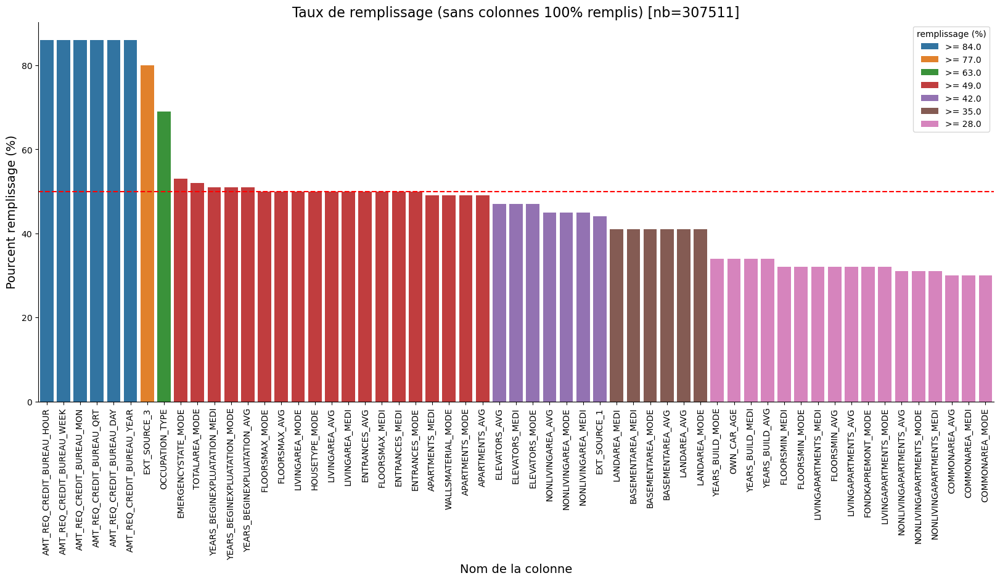

In [31]:
plot_bar_remplissage(application_train, nb=200, titre='application_train', figsize=(20, 8),
                         vertical=False, filled_cols=False, thresh=50)

**Bilan** :
***

- [X] Le fichier application_train.csv contient environ **307000 enregistrements** et **122 variables**. 
- [X] Ces variables contiennent les **statistiques personnelles d'un demandeur particulier**, telles que son âge, ses revenus, le type de prêt, les statistiques de son appartement, etc.

- [X] Il y a **307000 SK_ID_CURR uniques** qui représentent des demandes de prêt uniques. C'est un index. 
- [X] Le champ **TARGET** représente le **statut de défaut de paiement du prêt** :
    - 0 pour non défaillant,
    - et 1 pour défaillant.    

- [X] **children** représente le nombre d'enfants du demandeur. 
 
- [X] **FLAG_DOCUMENT_2, FLAG_DOCUMENT_3, .... FLAG_DOCUMENT_20 ,FLAG_DOCUMENT_21** :Ces features sont des features binaires indiquant la présence ou l'absence de documents spécifiques dans le dossier du demandeur. Chaque indicateur représente un type de document différent (par exemple, documents d'identification, documents relatifs aux revenus, etc.)
 
- [X] **AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR** représentent le nombre de demandes de renseignements ou de requêtes adressées au bureau de crédit par le demandeur dans des intervalles de temps spécifiques. Chaque feature correspond à une unité de temps différente (heure, jour, semaine, mois, trimestre, année).

#### Analyse de la TARGET

In [32]:
# --------------------------------------------------------------------
# -- AFFICHE LA LISTE DES IDENTIFIANTS UNIQUES
# --------------------------------------------------------------------

def print_unique_categories(data, column_name, show_counts=False):
    '''
    Function to print the basic stats such as unique categories and their counts for categorical variables

        Inputs:
        data: DataFrame
            The DataFrame from which to print statistics
        column_name: str
            Column's name whose stats are to be printed
        show_counts: bool, default = False
            Whether to show counts of each category or not

    '''

    print('-' * 79)
    print(
        f"Les catégories uniques de la variable '{column_name}' sont :\n{data[column_name].unique()}")
    print('-' * 79)

    if show_counts:
        print(
            f"Répartition dans chaque catégorie :\n{data[column_name].value_counts()}")
        print('-' * 79)


# --------------------------------------------------------------------
# -- BARPLOT DES VARIABLES CATEGORIELLES
# --------------------------------------------------------------------


def plot_categorical_variables_bar(data, column_name, figsize=(18, 6),
                                   percentage_display=True,
                                   plot_defaulter=True, rotation=0,
                                   horizontal_adjust=0,
                                   fontsize_percent='xx-small',
                                   palette1='Set1',
                                   palette2='Set2'):
    '''
    Function to plot Categorical Variables Bar Plots

    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display

    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    # plotting overall distribution of category
    plt.subplot(1, 2, 1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title('Toutes TARGET', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    # plotting distribution of category for Defaulters
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts(
        ) * 100 / data[column_name].value_counts()).dropna().sort_values(ascending=False)

        plt.subplot(1, 2, 2)
        sns.barplot(x=percentage_defaulter_per_category.index,
                    y=percentage_defaulter_per_category, palette=palette2)
        plt.ylabel(
            'Pourcentage par catégorie pour les défaillants',
            fontsize=20)
        plt.xlabel(column_name, labelpad=10)
        plt.xticks(rotation=rotation, fontsize=20)
        plt.yticks(fontsize=20)
        plt.title('Défaillants seuls', pad=20, fontsize=30)

    plt.suptitle(f'Répartition de {column_name}', fontsize=40)
    plt.show()


def plot_categorical_variable_bar(data, column_name, figsize=(18, 6),
                                  percentage_display=True, rotation=0,
                                  horizontal_adjust=0,
                                  fontsize_percent='xx-small',
                                  palette1='Set1'):
    '''
    Function to plot Categorical Variables Bar Plots

    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display

    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title(f'Barplot de {column_name}', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    plt.show()


# --------------------------------------------------------------------
# -- PIEPLOT DES VARIABLES CATEGORIELLES
# --------------------------------------------------------------------


def plot_categorical_variables_pie(
        data,
        column_name,
        plot_defaulter=True,
        hole=0):
    '''
    Function to plot categorical variables Pie Plots
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        plot_defaulter: bool
            Whether to plot the Pie Plot for Defaulters or not
        hole: int, default = 0
            Radius of hole to be cut out from Pie Chart
    '''
    if plot_defaulter:
        cols = 2
        specs = [[{'type': 'domain'}, {'type': 'domain'}]]
        titles = ['Toutes TARGET', 'Défaillants seuls']
    else:
        cols = 1
        specs = [[{'type': 'domain'}]]
        titles = [f'Répartition de la variable {column_name}']

    values_categorical = data[column_name].value_counts()
    labels_categorical = values_categorical.index

    fig = make_subplots(rows=1, cols=cols,
                        specs=specs,
                        subplot_titles=titles)

    fig.add_trace(
        go.Pie(
            values=values_categorical,
            labels=labels_categorical,
            hole=hole,
            textinfo='percent',
            textposition='inside'),
        row=1,
        col=1)

    if plot_defaulter:
        percentage_defaulter_per_category = data[column_name][data.TARGET == 1].value_counts(
        ) * 100 / data[column_name].value_counts()
        percentage_defaulter_per_category.dropna(inplace=True)
        percentage_defaulter_per_category = percentage_defaulter_per_category.round(
            2)

        fig.add_trace(
            go.Pie(
                values=percentage_defaulter_per_category,
                labels=percentage_defaulter_per_category.index,
                hole=hole,
                textinfo='percent',
                hoverinfo='label+value'),
            row=1,
            col=2)

    fig.update_layout(title=f'Répartition de la variable {column_name}')
    # fig.update_layout(
    #     title=f'Répartition de la variable {column_name}',
    #     x=0.5,  # Position horizontale centrée
    #     y=0.5,   # Position verticale centrée
    #     xanchor='center',  # Ancrage horizontal au centre
    #     yanchor='middle'  # Ancrage vertical au milieu
    # )

    fig.show()



"Distribution_de_la_target.png"


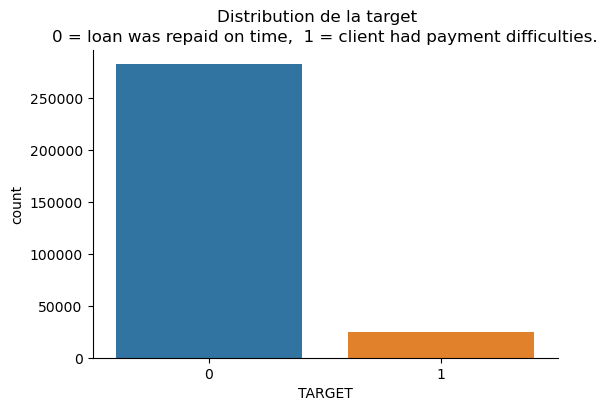

In [33]:
plt.figure(figsize=(6, 4))  # Adjust the values as needed
sns.countplot(x='TARGET', data=application_train)
sns.despine()
plt.suptitle('Distribution de la target')
plt.title('0 = loan was repaid on time,  1 = client had payment difficulties.')
to_png()

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Cash loans' 'Revolving loans']
-------------------------------------------------------------------------------


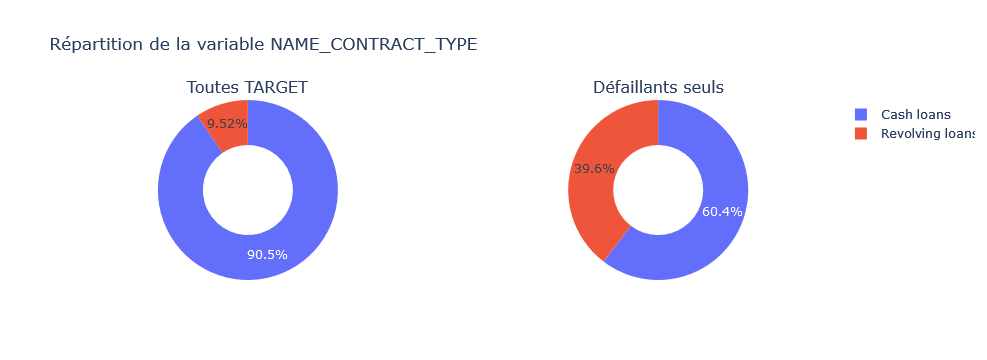

In [34]:
# valeurs uniques de  'NAME_CONTRACT_TYPE'
print_unique_categories(application_train, 'NAME_CONTRACT_TYPE')
plot_categorical_variables_pie(application_train,'NAME_CONTRACT_TYPE',hole=0.5)

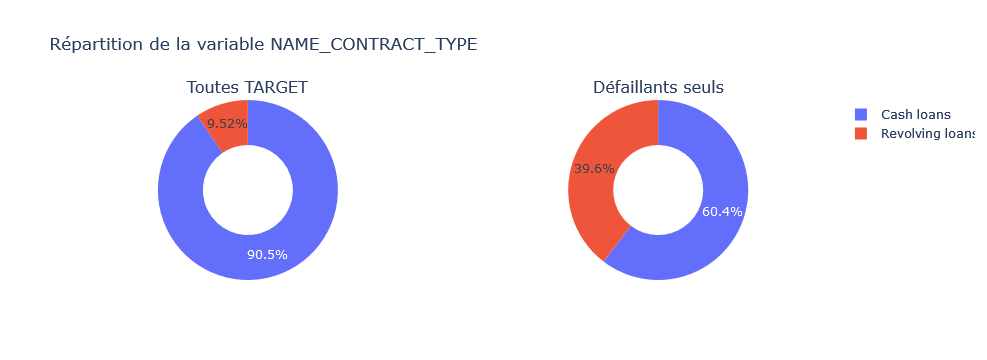

In [35]:
plot_categorical_variables_pie(application_train,'NAME_CONTRACT_TYPE',hole=0.5)

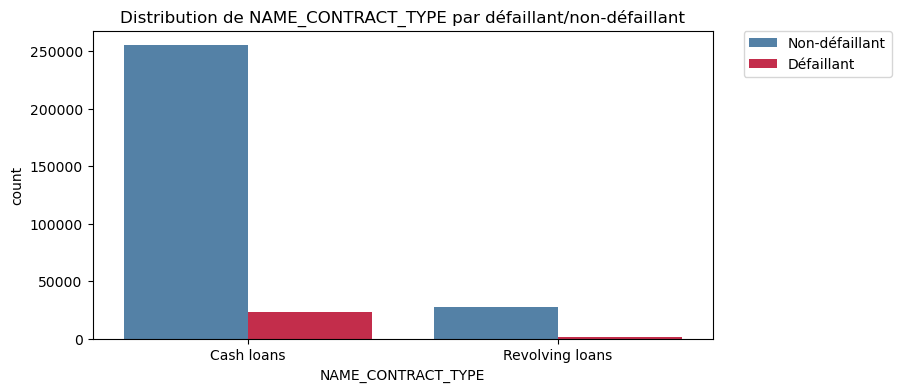

In [36]:

def plot_barplot_comp_target(dataframe, feature_name,
                             labels=['Non-défaillant', 'Défaillant'],
                             palette=['SteelBlue', 'crimson'],
                             rotation=0):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(8,4))
    sns.countplot(x=dataframe[feature_name], hue=dataframe.TARGET,
                  data=dataframe, palette=palette)
    plt.xticks(rotation=rotation)
    plt.title(f'Distribution de {feature_name} par défaillant/non-défaillant')
    plt.legend(labels=labels,
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train, 'NAME_CONTRACT_TYPE')

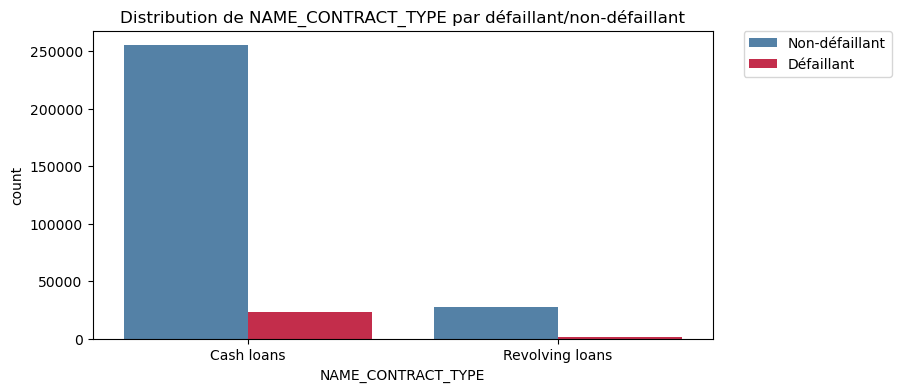

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_barplot_comp_target_percent(dataframe, feature_name,
                             labels=['Non-défaillant', 'Défaillant'],
                             palette=['SteelBlue', 'crimson'],
                             rotation=0):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(8,4))
    ax = sns.countplot(x=dataframe[feature_name], hue=dataframe.TARGET,
                  data=dataframe, palette=palette)
    
    plt.xticks(rotation=rotation)
    plt.title(f'Distribution de {feature_name} par défaillant/non-défaillant')
    plt.legend(labels=labels,
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    # Ajoutez les pourcentages au-dessus des barres
    total_counts = len(dataframe)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.,
                height + 3,  # Ajustez la hauteur de l'annotation si nécessaire
                f'{100 * height / total_counts:.2f}%', ha="center")
    
    plt.show()

# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train, 'NAME_CONTRACT_TYPE')


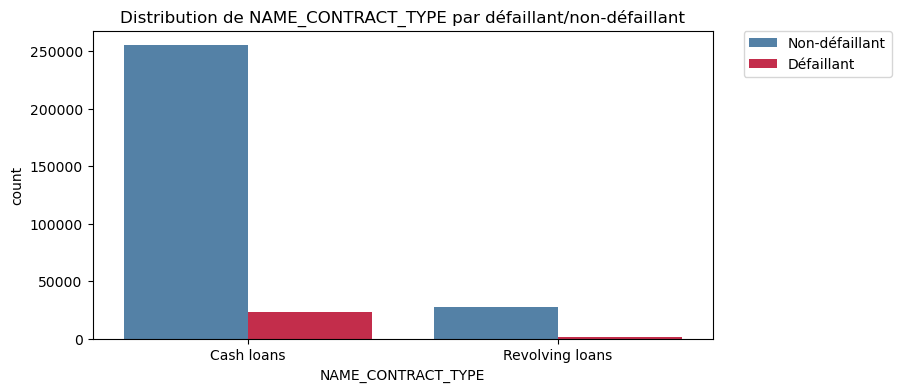

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_barplot_comp_target_percent(dataframe, feature_name,
                             labels   = ['Non-défaillant', 'Défaillant'],
                             palette  = ['SteelBlue', 'crimson'],
                             rotation = 0):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(8,4))
    ax = sns.countplot(x=dataframe[feature_name], hue=dataframe['TARGET'],
                  data=dataframe, palette=palette)
    
    plt.xticks(rotation=rotation)
    plt.title(f'Distribution de {feature_name} par défaillant/non-défaillant')
    plt.legend(labels=labels,
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    # Ajoutez les pourcentages au-dessus des barres
    total_counts = len(dataframe)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.,
                height + 3,  # Ajustez la hauteur de l'annotation si nécessaire
                f'{100 * height / total_counts:.2f}%', ha="center")
    
    plt.show()

# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train, 'NAME_CONTRACT_TYPE')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_GENDER' sont :
['M' 'F' 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
CODE_GENDER
F      202448
M      105059
XNA         4
Name: count, dtype: int64
-------------------------------------------------------------------------------


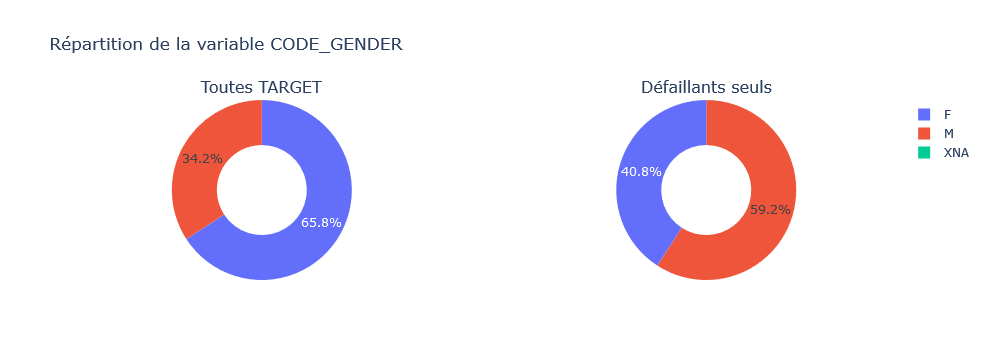

In [39]:
# valeurs uniques de 'CODE_GENDER'
print_unique_categories(application_train, 'CODE_GENDER', show_counts=True)
plot_categorical_variables_pie(application_train, 'CODE_GENDER', hole=0.5)

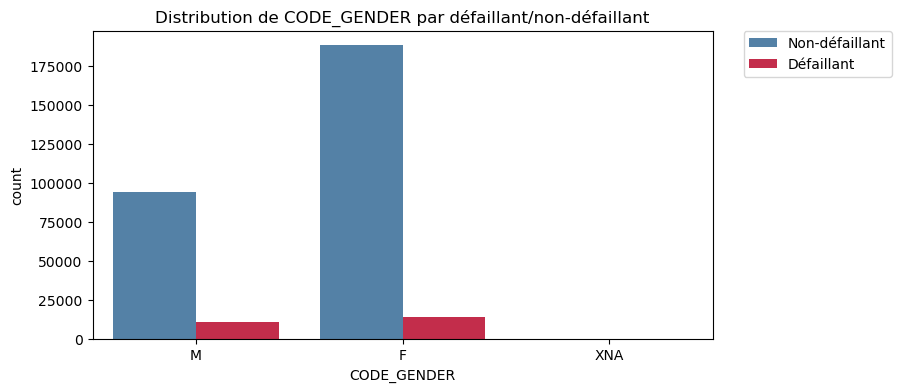

In [40]:
# Distribution selon le genre
plot_barplot_comp_target(application_train, 'CODE_GENDER')

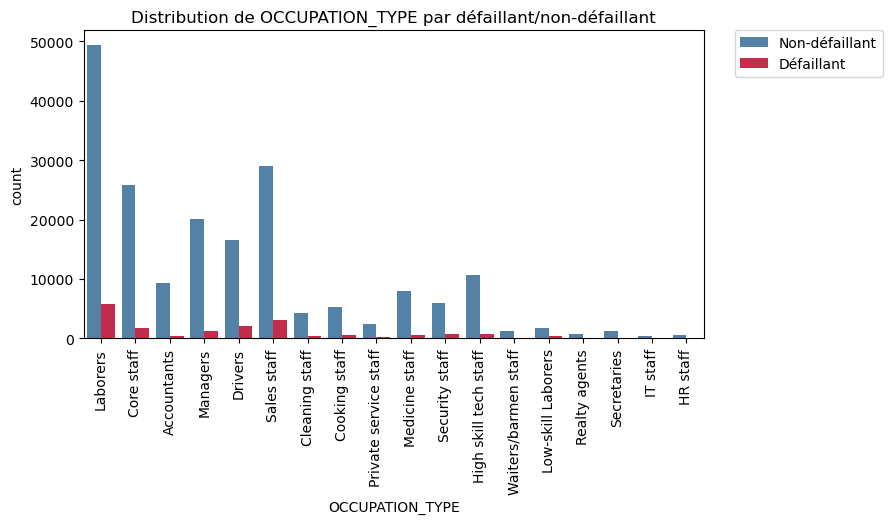

In [41]:
plot_barplot_comp_target(application_train, 'OCCUPATION_TYPE', rotation=90)

"Analyse_de_la_target.png"


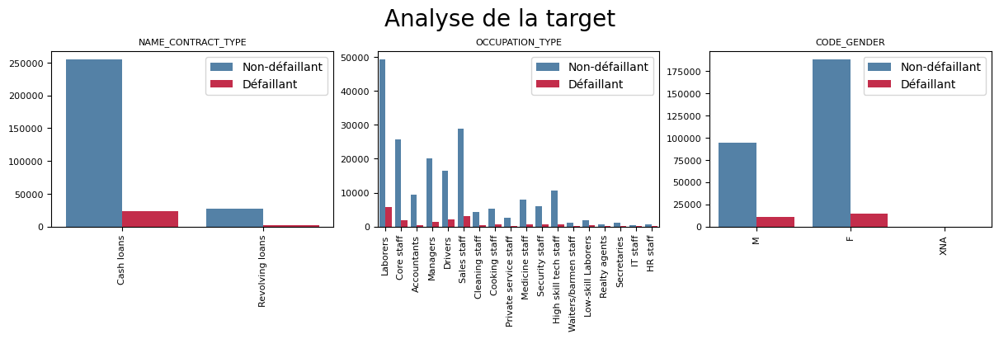

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

def trim_axs(axs, N):
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

def plot_barplot_comp_target(dataframe, feature_name, ax, target='TARGET',
                             labels=['Non-défaillant', 'Défaillant'], 
                             palette=['SteelBlue', 'crimson'], rotation=90):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    sns.countplot(x=feature_name, hue=target, data=dataframe, palette=palette, ax = ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=rotation)
    ax.set_title(f'{feature_name}', fontsize=8)
    # Fixer la taille des étiquettes de l'axe y et x
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=8)
    # Supprimez les étiquettes de l'axe des y
    ax.set_xlabel('')
    ax.set_ylabel('')
    # Placer la légende au meilleur endroit
    ax.legend(labels=labels, loc='best', prop={'size': 10})

# Créer une liste de variables à croiser avec la cible (target)
variables_to_plot = ['NAME_CONTRACT_TYPE', 'OCCUPATION_TYPE', 'CODE_GENDER']  # Ajoutez vos variables ici

# nrows = 3  # Nombre de lignes dans la grille
# ncols = 3  # Nombre de colonnes dans la grille

# Créer une grille de graphiques en croisant chaque variable avec la cible
def graphic_analysis_target(dataframe, target='TARGET', variables_to_plot=None, ncols=3, 
                            title="Analyse de la target"):
    if not variables_to_plot:
        variables_to_plot = list(dataframe.select_dtypes(object).columns)
        
    nplot = len(variables_to_plot)
    nrows = int(np.ceil(nplot/ ncols))  # Calcul du nombre de lignes en fonction du nombre de colonnes et du nombre de variables
    
    fig = plt.figure(figsize=(ncols*4, nrows*4), constrained_layout=True)
    axs = fig.subplots(nrows, ncols)
    # plt.subplots_adjust(hspace=0.5, wspace=0.2)  # Ajustez ces valeurs selon vos préférences

    axs = trim_axs(axs, nplot)
    # plt.subplots_adjust(hspace=1.0, wspace=0.2)  # Ajuster l'espacement vertical entre les graphiques

    for ax, var in zip(axs, variables_to_plot):
        plot_barplot_comp_target(dataframe, var, ax=ax, target=target, rotation=90)

    # fig.suptitle('Analyse de la target', ha="center", fontsize=12)
    #plt.tight_layout()
    
    # Ajuster l'espace entre le haut du graphique et le titre
    # plt.subplots_adjust(top=0.2)
    
    fig.suptitle(title, fontsize=20) # y=1.1,

    # plt.title(title,  fontsize=20,  ha="center")
    # fig.text(0.5, 1.1, r"Analyse de la target", ha="center", fontsize=20)
    to_png()
    plt.show()

# Appeler la fonction pour afficher les graphiques
graphic_analysis_target(application_train,  target='TARGET', 
                        variables_to_plot=variables_to_plot)


"Analyse_de_la_target_ensemble_des_variables.png"


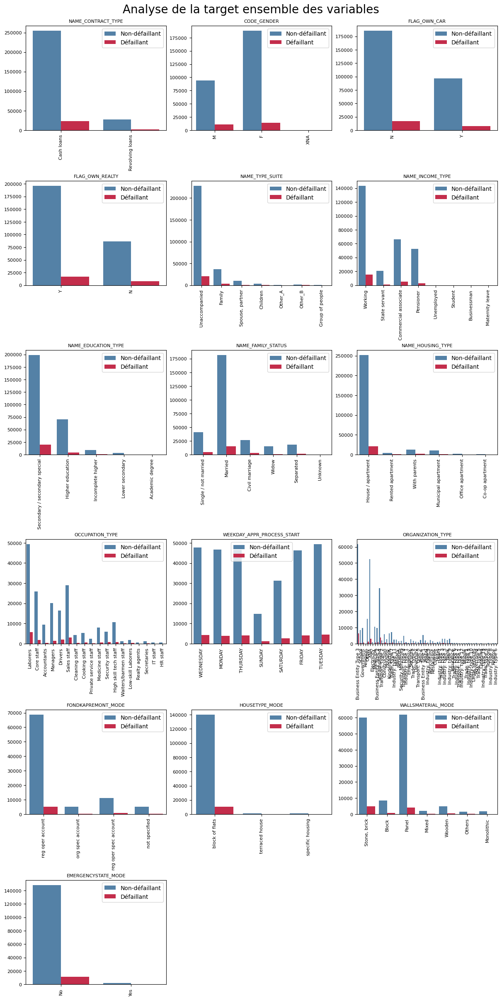

In [43]:
graphic_analysis_target(application_train, target='TARGET', 
                        title="Analyse de la target ensemble des variables")

In [44]:
def bar_plot(df, variable, figsize=(6, 4)):
    counts = df[variable].value_counts(normalize=True)
    
    fig, ax = plt.subplots(figsize=figsize)
    bars = plt.bar(counts.index, counts.values)
    
    plt.ylabel('Proportion')
    plt.ylim(0, 1.1)
    plt.title('Distribution of ' + str(variable))
    
    # Ajoutez une étiquette au survol de la souris pour chaque barre
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2%}', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),  # 3 points de décalage vers le haut
                     textcoords='offset points', ha='center', va='bottom')
    
    plt.xticks(rotation=45)  # Fait pivoter les étiquettes de l'axe x pour plus de lisibilité
    plt.show()

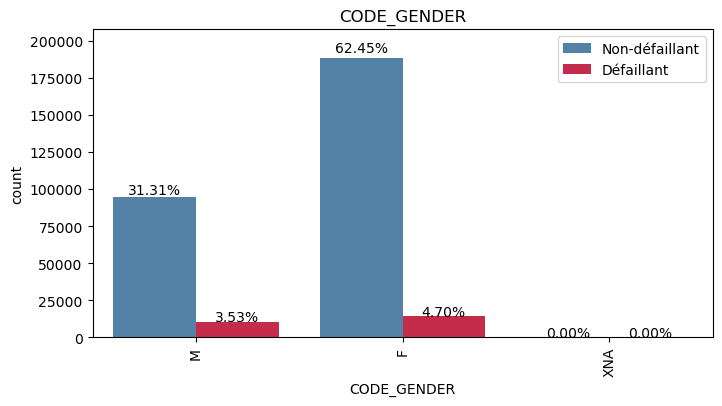

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_barplot_comp_target_percent(dataframe, feature_name,
                             labels=['Non-défaillant', 'Défaillant'],
                             palette=['SteelBlue', 'crimson'],
                             rotation=90):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(8,4))
    ax = sns.countplot(x=dataframe[feature_name], hue=dataframe.TARGET,
                  data=dataframe, palette=palette)
    # Augmentation de la taille de l'axe des y de 5%
    y_scale_factor = 1.05
    ax.set_ylim(0, ax.get_ylim()[1] * y_scale_factor)
    
    plt.xticks(rotation=rotation)
    plt.title(f'{feature_name}')
    plt.legend(labels=labels, loc='best')
    
    # Ajoutez les pourcentages au-dessus des barres
    total_counts = len(dataframe)
    for p in ax.patches:
        height = 1.02*p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.,
                height +0.5,  # Ajustez la hauteur de l'annotation si nécessaire
                f'{100 * height / total_counts:.2f}%', ha="center")
    
    plt.show()

plot_barplot_comp_target_percent(application_train,  'CODE_GENDER')

TARGET,0,1
CODE_GENDER,,
F,93.000672,6.999328
M,89.858080,10.141920
XNA,100.000000,0.000000


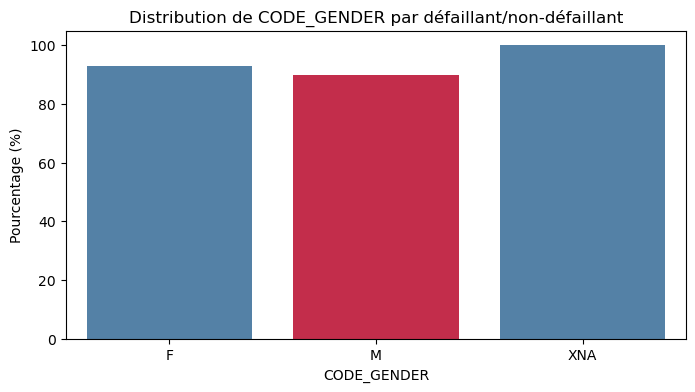

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_barplot_comp_target_percent(dataframe, feature_name,
                             labels=['Non-défaillant', 'Défaillant'],
                             palette=['SteelBlue', 'crimson'],
                             rotation=0):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(8, 4))
    
    # Regroupez les données par feature_name et TARGET et calculez les pourcentages
    grouped_data = dataframe.groupby([feature_name, 'TARGET']).size().unstack(fill_value=0)
    percentages = grouped_data.div(grouped_data.sum(axis=1), axis=0) * 100
    display(percentages)
    ax = sns.barplot(x=percentages.index, y=percentages.iloc[:,0], palette=palette)
    
    plt.xticks(rotation=rotation)
    plt.title(f'Distribution de {feature_name} par défaillant/non-défaillant')
    plt.ylabel('Pourcentage (%)')

    plt.show()

# Exemple d'utilisation :
plot_barplot_comp_target_percent(application_train,  'CODE_GENDER')


"Payment_defaults_by_category.png"


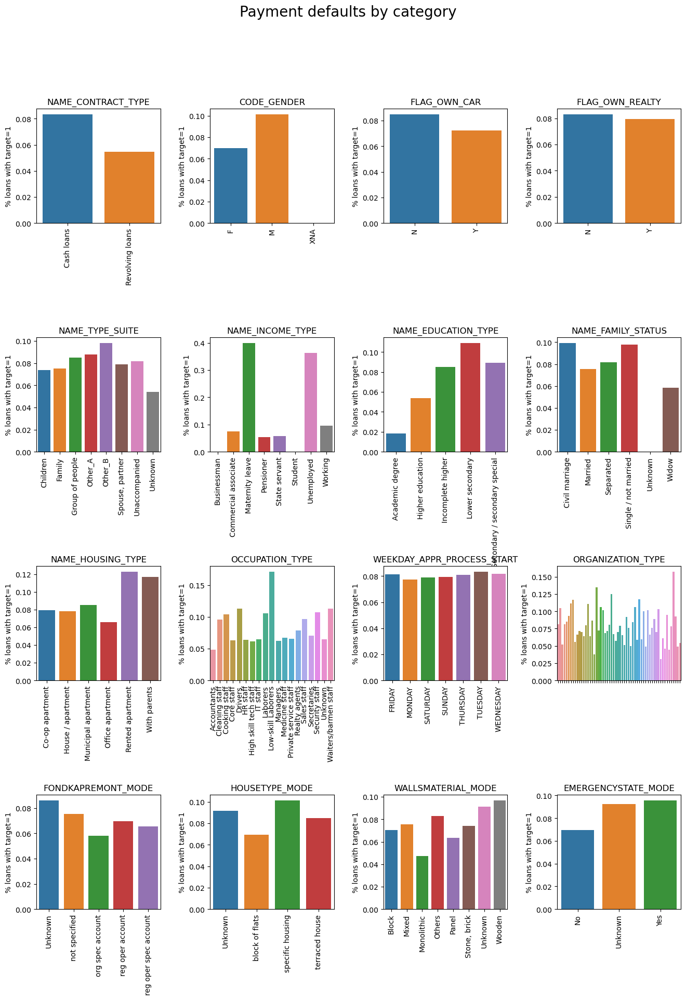

In [47]:
def plot_loan_defaults_by_categ(df, title='Payment defaults by category'):
    categorical_cols = list(df.select_dtypes(object).columns)
    n_cols = min(4, len(categorical_cols))
    n_rows = len(categorical_cols) // n_cols + \
        (len(categorical_cols) % n_cols > 0)
    fig = plt.figure(figsize=(n_cols*4, n_rows*5))

    for n, feature in enumerate(categorical_cols):
        ax = plt.subplot(n_rows, n_cols, n + 1)
        # Calculate the percentage of target=1 per category value
        cat_perc = df[[feature, 'TARGET']].fillna(
            "Unknown").groupby([feature], as_index=False).mean()
        # cat_perc.sort_values(by='TARGET', ascending=False, inplace=True)
        cat_perc.sort_values(by=feature, inplace=True)
        sns.barplot(ax=ax, x=feature, y='TARGET',
                    order=cat_perc[feature], data=cat_perc)
        plt.xlabel('')
        plt.ylabel('% loans with target=1')
        plt.title(feature)
        if len(cat_perc) > 20:
            ax.xaxis.set_ticklabels([])
        plt.xticks(rotation=90)

    plt.subplots_adjust(hspace=1.0, wspace=0.4)
    fig.suptitle(title, fontsize=20) # y=1.1,
    
font_title_g = {'family': 'serif', 'color': '#114b98', 'weight': 'bold', 'size': 40, }
plot_loan_defaults_by_categ(application_train)
to_png()

C:\Users\Fane0763\AppData\Local\Temp\ipykernel_14428\1599451312.py:14: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\Fane0763\AppData\Local\Temp\ipykernel_14428\1599451312.py:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\Fane0763\AppData\Local\Temp\ipykernel_14428\1599451312.py:20: UserWarning:



`

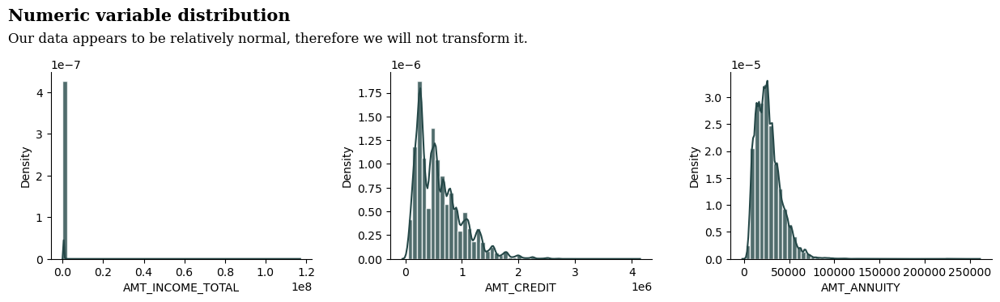

In [48]:
import matplotlib.gridspec as gridspec
numeric_cols = application_train.select_dtypes(include='float64').columns
df= application_train
gs = gridspec.GridSpec(1, 3)

fig = plt.figure(figsize=(15, 3))


fig.text(0.09, 1.09, 'Numeric variable distribution', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.09, 1, 'Our data appears to be relatively normal, therefore we will not transform it.', fontsize=12, fontweight='light', fontfamily='serif')


ax1 = fig.add_subplot(gs[0, 0]) # row 0, col 0
ax1 = sns.distplot(df[numeric_cols[0]],color='#244747', hist_kws=dict(edgecolor="white", linewidth=1, alpha=0.8))

ax2 = fig.add_subplot(gs[0, 1]) # row 0, col 1
ax2 = sns.distplot(df[numeric_cols[1]],color='#244747',hist_kws=dict(edgecolor="white", linewidth=1,alpha=0.8))

ax3 = fig.add_subplot(gs[0, 2]) # row 1, span all columns
ax3 = sns.distplot(df[numeric_cols[2]],color='#244747',hist_kws=dict(edgecolor="white", linewidth=1,alpha=0.8))

sns.despine()

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None) # useful for adjusting space between subplots


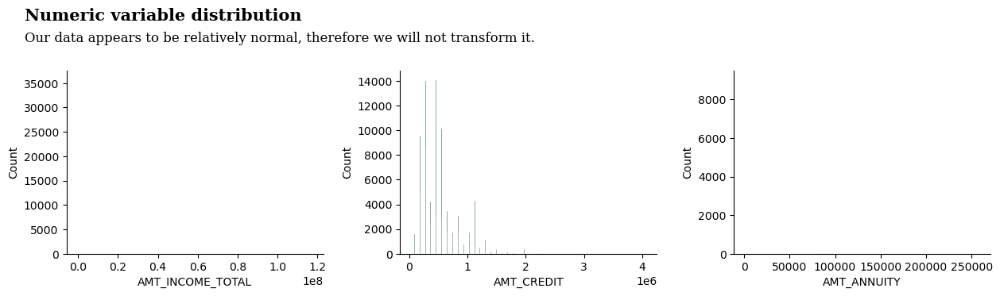

In [49]:
import matplotlib.gridspec as gridspec
numeric_cols = application_train.select_dtypes(include='float64').columns
df= application_train

# FutureWarning: is_categorical_dtype is deprecated...
from pandas.api.types import CategoricalDtype
is_categorical = isinstance(df[numeric_cols[0]].dtype, CategoricalDtype)

# FutureWarning: use_inf_as_na option is deprecated...
df.replace([np.inf, -np.inf], np.nan, inplace=True)

gs = gridspec.GridSpec(1, 3)
fig = plt.figure(figsize=(15, 3))

fig.text(0.09, 1.09, 'Numeric variable distribution', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.09, 1, 'Our data appears to be relatively normal, therefore we will not transform it.', fontsize=12, fontweight='light', fontfamily='serif')


ax1 = fig.add_subplot(gs[0, 0]) # row 0, col 0
sns.histplot(df[numeric_cols[0]], color='#244747', ax = ax1, edgecolor="white", linewidth=1, alpha=0.8)
ax2 = fig.add_subplot(gs[0, 1]) # row 0, col 1
sns.histplot(df[numeric_cols[1]],color='#244747', ax = ax2, edgecolor="white", linewidth=1, alpha=0.8)
ax3 = fig.add_subplot(gs[0, 2]) # row 1, span all columns
sns.histplot(df[numeric_cols[2]],color='#244747', ax = ax3, edgecolor="white", linewidth=1, alpha=0.8)
sns.despine()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None) # useful for adjusting space between subplots


In [50]:
# Histplot for eac feature
import math
def plot_draw(df, cols=5, width=10, height=10, hspace=0.2, wspace=0.5):
    """Ploting the individual feature histplot"""
    # plt.style.use('seaborn-whitegrid')
    fig = plt.figure(figsize=(width,height))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
    rows = math.ceil(float(df.shape[1]) / cols)
    for i, column in enumerate(df.columns):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.set_title(column)
        if df.dtypes[column] == 'object':
            g = sns.countplot(y=column, data=df)
            substrings = [s.get_text()[:18] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)
            plt.xticks(rotation=25)
        else:
            g = sns.displot(df[column])
            plt.xticks(rotation=25)
    
# plot_draw(application_train, cols=3, width=20, height=10, hspace=0.45, wspace=0.5)

In [51]:
# # test de normalité
# from some_library import probplot

# shapiro_test = {}
# j=2
# plt.figure(figsize=(20, 10))
# for i in range(0,6):
#     ax = plt.subplot(2,3,i+1)
#     probplot(x = df[df.columns[j]], dist=norm, plot=ax)
#     plt.title(df.columns[j])
#     shapiro_test[df.columns[j]] = shapiro(df[df.columns[j]])
#     j += 1
    
# plt.show()

# pd.DataFrame(shapiro_test, index=['Statistic', 'p-value']).transpose()

In [52]:
# # Let's try BoxCox transformation et test de normalité
# from scipy.stats import boxcox
# shapiro_test = {}
# lambdas = {}
# j=2
# plt.figure(figsize=(20, 10))
# for i in range(6):
#     ax = plt.subplot(2,3,i+1)
#     x, lbd = boxcox(df[df.columns[j]])
#     probplot(x = x, dist=norm, plot=ax)
#     plt.title(df.columns[j])
#     shapiro_test[df.columns[j]] = shapiro(x)
#     lambdas[df.columns[j]] = lbd
#     j+=1
    
# plt.show()

# pd.DataFrame(shapiro_test, index=['Statistic', 'p-value']).transpose()

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_numeric_variable_distribution(dataframe, ncols=4):
    """
    Affiche la distribution des variables numériques dans un ensemble de subplots.

    dataframe (DataFrame) : Le DataFrame contenant les variables numériques.
    ncols (int) : Le nombre de colonnes dans la grille de subplots.
    """
    
    numeric_columns = dataframe.select_dtypes(include=np.number).columns

    # Calcul du nombre de lignes en fonction du nombre de colonnes
    nrows = (len(numeric_columns) + ncols - 1) // ncols

    # Création de la grille de subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*5))
    axes = axes.ravel()

    # Itération à travers les colonnes numériques et création des graphiques de distribution
    for i, col in enumerate(numeric_columns):
        sns.histplot(dataframe[col], ax=axes[i], kde=True)
        axes[i].set_title(f'Distribution de {col}')
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')

    # Suppression des subplots non utilisés
    for j in range(len(numeric_columns), nrows * ncols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [54]:
numeric_columns = application_train.select_dtypes(include=np.number).columns
print(len(numeric_columns))

106


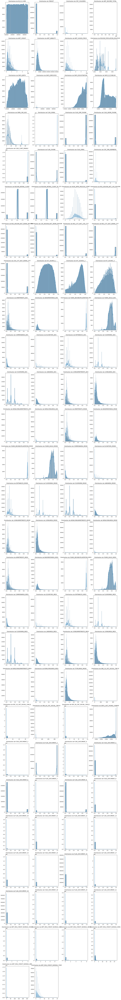

In [55]:
# Exemple d'utilisation
plot_numeric_variable_distribution(application_train, ncols = 4)

### <font color="#337da4" id="2">2. Preprocessing des données </font>
----------------------------------
Pour le preprocessing des jeux de données, nous allons utiliser le kernel Kaggle. Le lien se trouve ci dessous. 

kernel Kaggle utilisé : https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script

In [56]:
from EDA_Kernel_Kaggle import *

Le code s'exécute dans un environnement local.


In [57]:
def preprocessing_data(num_rows=None, debug=False):
    df = application_train_test(num_rows)
    start = time.time()
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()

    time_taken = time.time() - start
    print(f'preprocessing completed in {time_taken:.0f} s')
    return df


In [58]:
savepath = f'{OUT_FOLDER}/{CLEAN_DATA_FILENAME}'
if os.path.exists(savepath):
    # reload preprocessed data (< 1 minute)
    print('Chargement du preprocessed data')
    df = pd.read_csv(savepath)
else:
    print('Preprocessing des données.')
    df = preprocessing_data(num_rows=None, debug=False)


print(f'df_data.shape = {df.shape}')

Preprocessing des données.
Train samples: 307511, test samples: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 38s
Previous applications df shape: (338857, 249)
Process previous_applications - done in 26s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 15s
Installments payments df shape: (339587, 26)
Process installments payments - done in 32s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 19s
preprocessing completed in 131 s
df_data.shape = (356251, 797)


In [59]:
# num_rows = None
# df = application_train_test(num_rows)

# with timer("Process bureau and bureau_balance"):
#     bureau = bureau_and_balance(num_rows)
#     print("Bureau df shape:", bureau.shape)
#     df = df.join(bureau, how='left', on='SK_ID_CURR')
#     del bureau
#     gc.collect()
# with timer("Process previous_applications"):
#     prev = previous_applications(num_rows)
#     print("Previous applications df shape:", prev.shape)
#     df = df.join(prev, how='left', on='SK_ID_CURR')
#     del prev
#     gc.collect()
# with timer("Process POS-CASH balance"):
#     pos = pos_cash(num_rows)
#     print("Pos-cash balance df shape:", pos.shape)
#     df = df.join(pos, how='left', on='SK_ID_CURR')
#     del pos
#     gc.collect()
# with timer("Process installments payments"):
#     ins = installments_payments(num_rows)
#     print("Installments payments df shape:", ins.shape)
#     df = df.join(ins, how='left', on='SK_ID_CURR')
#     del ins
#     gc.collect()
# with timer("Process credit card balance"):
#     cc = credit_card_balance(num_rows)
#     print("Credit card balance df shape:", cc.shape)
#     df = df.join(cc, how='left', on='SK_ID_CURR')
#     del cc
#     gc.collect()

### Colonnes avec des valeurs infinis

In [60]:
def get_columns_with_infinite_values(df):
    # Liste pour stocker les informations sur les colonnes avec des valeurs infinies
    result_data = []

    # Identifie les colonnes avec des valeurs infinies
    numeric_cols = df.select_dtypes(include=[np.number])
    
    for col in numeric_cols.columns:
        inf_rows = df[col].isin([np.inf, -np.inf]).sum()
        
        if inf_rows > 0:
            result_data.append({'colonne': col, 'inf_count': inf_rows})

    # Crée le DataFrame à partir de la liste
    result_df = pd.DataFrame(result_data)

    # Renvoie le DataFrame résumant les colonnes avec des valeurs infinies
    return result_df 

get_columns_with_infinite_values(df)

,colonne,inf_count
0,PREV_APP_CREDIT_PERC_MAX,1
1,REFUSED_APP_CREDIT_PERC_MAX,1
2,INSTAL_PAYMENT_PERC_MAX,19


In [61]:
def get_rows_with_infinite_values(df, inf_cols=None):
    if inf_cols is None:
        numeric_cols = df.select_dtypes(include=[np.number])
        inf_cols = numeric_cols.columns[numeric_cols.isin([np.inf, -np.inf]).any()].tolist()

    # Identifie les lignes avec des valeurs infinies dans les colonnes spécifiées
    inf_rows = df.index[df[inf_cols].isin([np.inf, -np.inf]).any(axis=1)]

    # Convertit l'index des lignes en une liste Python
    return inf_rows.tolist()

print(get_rows_with_infinite_values(df))

[5687, 60477, 79077, 89018, 98509, 126768, 128791, 140426, 152087, 167136, 199103, 201086, 236164, 238381, 272829, 277962, 287300, 292852, 305373, 310339]


In [62]:
def replace_infinite_values_with_nan(df: pd.DataFrame):
    # Affiche un message pour indiquer le début de l'opération
    print(f'Remplacement des valeurs infinies par NaN')
    # remplacer les valeurs infinies par NaN
    return df.replace([np.inf, -np.inf], np.nan)

df_data = replace_infinite_values_with_nan(df)

Remplacement des valeurs infinies par NaN


## Filtrer variables avec une seule valeur

Les colonnes avec seulement une valeur ne sont pas discriminatoire : le coefficient de correlation sera NaN, et l'imputation pour les modèles donne une variable qui est constante.

In [63]:
def cols_to_index(df: pd.DataFrame, col_names):
    """Convertir les noms des colonnes en index"""
    return [df.columns.get_loc(c) for c in col_names if c in df]


def get_cols_with_unique_value(df: pd.DataFrame):
    unique_vals = df.nunique()
    return unique_vals[unique_vals == 1].index.to_list()


single_val_cols = get_cols_with_unique_value(df_data)
print(cols_to_index(df_data, single_val_cols))

[278, 283, 299, 308, 397, 405, 408, 434, 439, 444, 454, 467, 496, 502, 506, 515, 527, 533, 628, 761, 776, 781, 791, 792, 793, 794, 795]


In [64]:
def get_non_var_columns(df: pd.DataFrame):
    std_dev = df.std()
    return std_dev[std_dev == 0].index.to_list()


non_var_cols = get_non_var_columns(df_data)
print(cols_to_index(df_data, non_var_cols))

[278, 283, 299, 308, 397, 405, 408, 434, 439, 444, 454, 467, 496, 502, 506, 515, 527, 533, 628, 761, 776, 781, 791, 792, 793, 794, 795]


In [65]:
def drop_cols_with_unique_value(df: pd.DataFrame, cols_to_drop=None):
    if cols_to_drop is None:
        cols_to_drop = get_cols_with_unique_value(df)
    if len(cols_to_drop) > 0:
        print(f'drop_drop_cols_with_unique_value, nb.cols = {len(cols_to_drop)}')
        return df.drop(columns=cols_to_drop)
    else :
        print('Le dataframe ne contient pas de colonnes constantes')
    return df


df_data = drop_cols_with_unique_value(df_data)

drop_drop_cols_with_unique_value, nb.cols = 27


In [66]:
df_data.shape

(356251, 770)

In [67]:
df_data.columns

Index(['SK_ID_CURR', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'CC_NAME_CONTRACT_STATUS_Sent proposal_MAX',
       'CC_NAME_CONTRACT_STATUS_Sent proposal_MEAN',
       'CC_NAME_CONTRACT_STATUS_Sent proposal_SUM',
       'CC_NAME_CONTRACT_STATUS_Sent proposal_VAR',
       'CC_NAME_CONTRACT_STATUS_Signed_MIN',
       'CC_NAME_CONTRACT_STATUS_Signed_MAX',
       'CC_NAME_CONTRACT_STATUS_Signed_MEAN',
       'CC_NAME_CONTRACT_STATUS_Signed_SUM',
       'CC_NAME_CONTRACT_STATUS_Signed_VAR', 'CC_COUNT'],
      dtype='object', length=770)

### Train and test sets

Nous allons re splitter les données en train et test. 

In [68]:
df       = df_data
train_df = df[df['TARGET'].notnull()]
test_df  = df[df['TARGET'].isnull()]

print("Taille du train : {}".format(train_df.shape))
print("Taille du test  : {}".format(test_df.shape))

Taille du train : (307507, 770)
Taille du test  : (48744, 770)


In [69]:
# ls
# train_df=train_df.set_index('SK_ID_CURR')
# test_df=test_df.set_index('SK_ID_CURR')
# test_df.head()

### Données dupliquées

In [70]:
print("Nombre de lignes dupliquées dans train : {}".format(data_duplicated(train_df)))
print("Nombre de lignes dupliquées dans test  : {}".format(data_duplicated(test_df)))

Nombre de lignes dupliquées dans train : 0
Nombre de lignes dupliquées dans test  : 0


Il n'y a pas de doublons dans notre jeu de données. 

Voyons désormais les données manquantes.

#### Données manquantes

Types de variables de : None


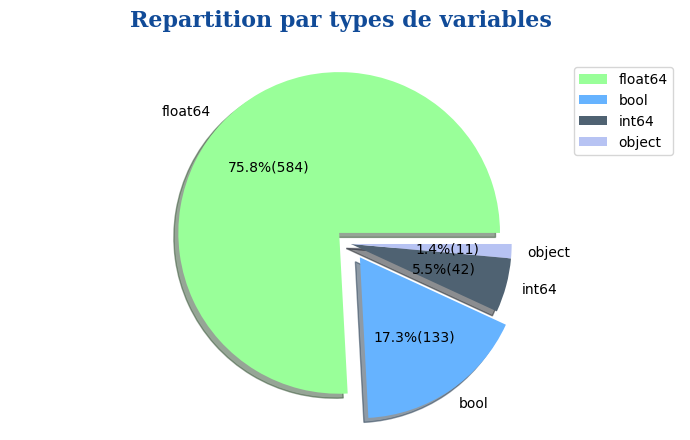

,Types de variables,Nombre
0,float64,584
1,bool,133
2,int64,42
3,object,11


**************************************************************************************************************
Taux de complétion de : None
**************************************************************************************************************


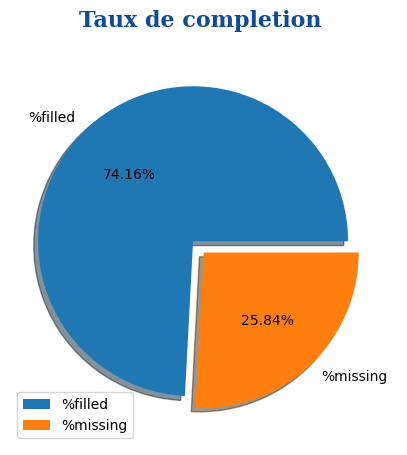

**************************************************************************************************************
Heatmap des valeurs manquantes : None
**************************************************************************************************************


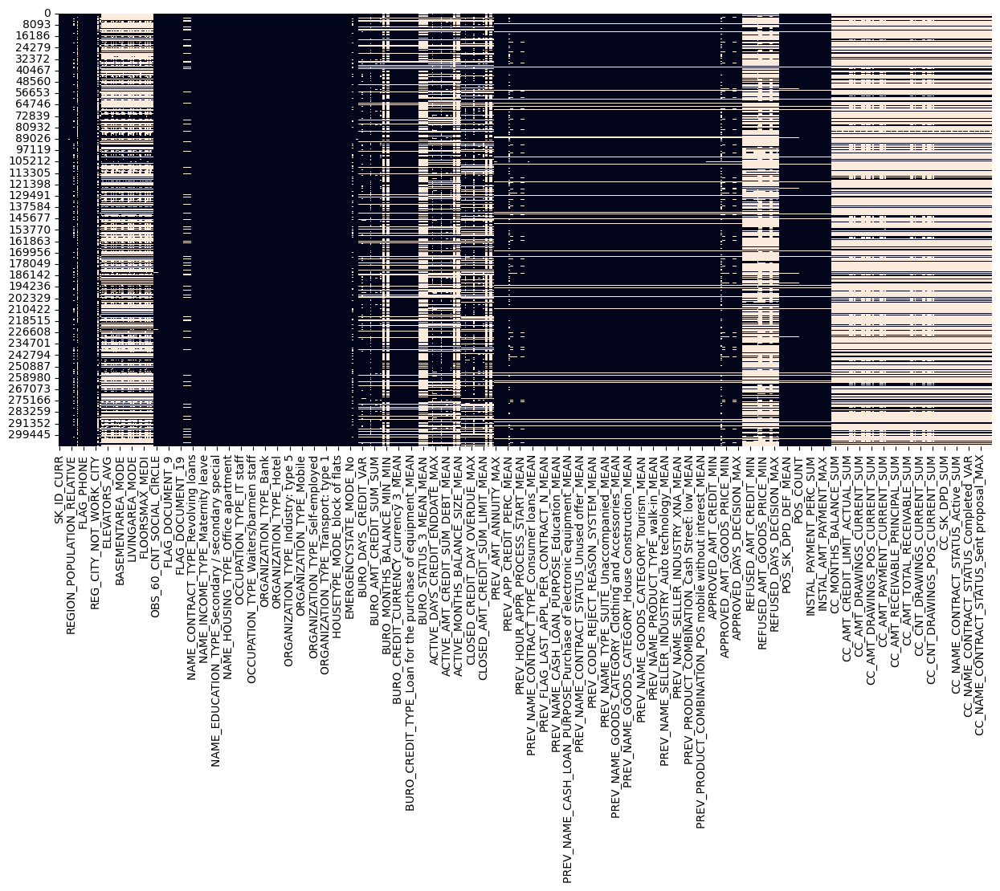

**************************************************************************************************************
Réprésentation visuelle des valeurs manquantes : None
**************************************************************************************************************
Nombre de variables avec valeurs manquantes : 589


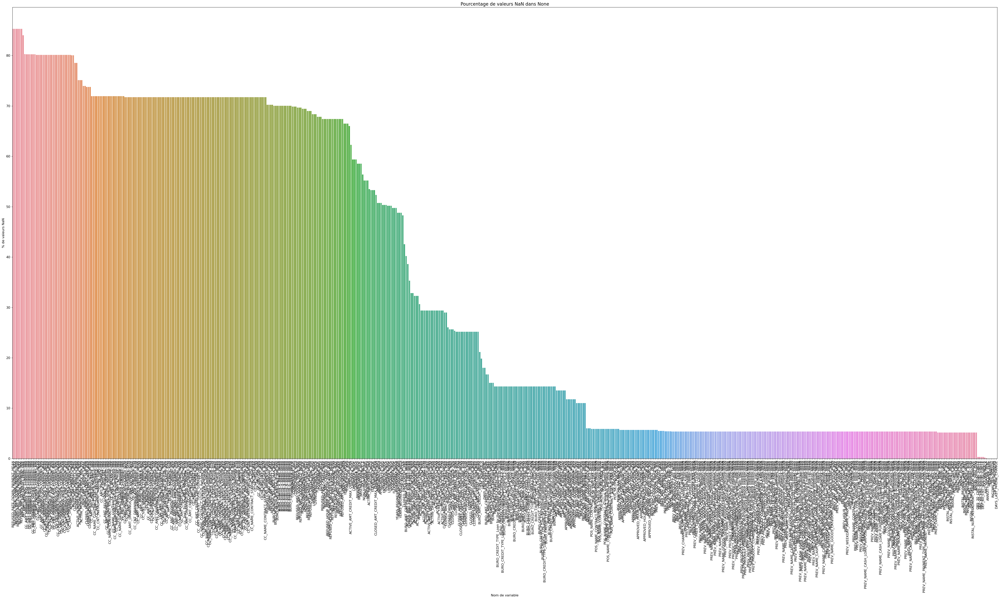

In [71]:
exploration_missings(train_df)

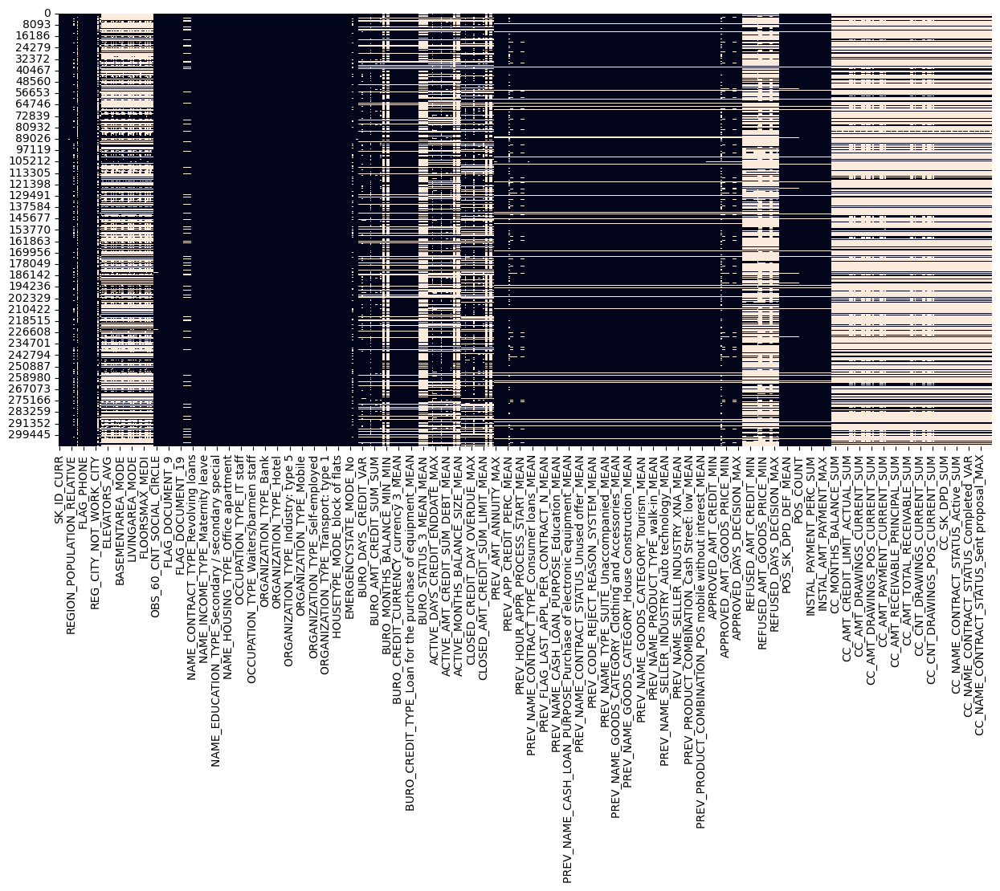

In [72]:
# msno.matrix(df_data)
# msno.matrix(data)
plt.figure(figsize=(15,7))
sns.heatmap(train_df.isna(), cbar=False)
plt.show()

<Axes: >

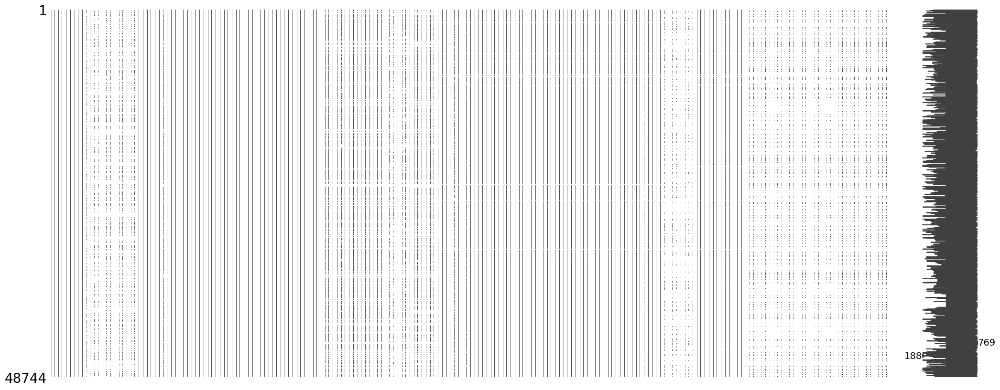

In [73]:
msno.matrix(test_df)

---------
Nous allons supprimer toutes les colonnes presentant plus de 40% de valeurs manquantes. Ce choix est arbitraire. 

In [74]:
train_df = drop_columns_empty(train_df,0.4)

Suppression de la variable OWN_CAR_AGE avec % de valeurs manquantes 0.66
Suppression de la variable EXT_SOURCE_1 avec % de valeurs manquantes 0.56
Suppression de la variable APARTMENTS_AVG avec % de valeurs manquantes 0.51
Suppression de la variable BASEMENTAREA_AVG avec % de valeurs manquantes 0.59
Suppression de la variable YEARS_BEGINEXPLUATATION_AVG avec % de valeurs manquantes 0.49
Suppression de la variable YEARS_BUILD_AVG avec % de valeurs manquantes 0.66
Suppression de la variable COMMONAREA_AVG avec % de valeurs manquantes 0.7
Suppression de la variable ELEVATORS_AVG avec % de valeurs manquantes 0.53
Suppression de la variable ENTRANCES_AVG avec % de valeurs manquantes 0.5
Suppression de la variable FLOORSMAX_AVG avec % de valeurs manquantes 0.5
Suppression de la variable FLOORSMIN_AVG avec % de valeurs manquantes 0.68
Suppression de la variable LANDAREA_AVG avec % de valeurs manquantes 0.59
Suppression de la variable LIVINGAPARTMENTS_AVG avec % de valeurs manquantes 0.68
Supp

In [75]:
train_df.shape

(307507, 534)

In [76]:
test_df = test_df[train_df.columns]
print(test_df.shape)

(48744, 534)


### Quelques corrections

In [77]:
train_df.sort_values('SK_ID_CURR').head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19.0
1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25.0
2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,135000.0,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3.0
3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,-12.0,-271.625000,-4346.0,16.0
4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,-14.0,-1032.242424,-68128.0,66.0


In [78]:
test_df.sort_values('SK_ID_CURR').describe()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
count,48744.000000,0.0,48744.000000,48744.000000,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,...,47944.000000,4.794400e+04,47943.000000,4.794300e+04,47943.000000,4.794400e+04,47943.000000,47943.000000,47944.000000,47944.000000
mean,277796.676350,NaN,0.670400,0.337129,0.309495,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,...,19973.251539,7.483533e+05,5797.489267,1.513860e+05,20521.495938,7.629358e+05,-332.380222,-928.995532,-44437.099095,42.003358
std,103169.547296,NaN,0.470073,0.472734,0.462290,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,...,24179.897932,9.677615e+05,14931.603025,2.604414e+05,25933.206176,1.012906e+06,540.386007,598.098073,59897.523147,42.866936
min,100001.000000,NaN,0.000000,0.000000,0.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,...,104.443636,3.990600e+02,0.000000,1.065150e+02,99.765000,0.000000e+00,-2922.000000,-2922.000000,-483110.000000,1.000000
25%,188557.750000,NaN,0.000000,0.000000,0.000000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,...,8541.412866,1.513446e+05,45.000000,1.644151e+04,8273.168191,1.481716e+05,-401.000000,-1313.095201,-53162.500000,12.000000
50%,277549.000000,NaN,1.000000,0.000000,0.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,...,13735.345714,3.736115e+05,2381.760000,4.377807e+04,13489.159091,3.660593e+05,-64.000000,-801.833333,-21896.000000,26.000000
75%,367555.500000,NaN,1.000000,1.000000,1.000000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,...,23251.799893,9.510934e+05,7515.765000,1.540484e+05,23475.929748,9.566025e+05,-24.000000,-445.985714,-6952.500000,55.000000
max,456250.000000,NaN,1.000000,1.000000,1.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,...,946490.062500,3.247978e+07,905408.595000,3.436835e+06,946490.062500,3.268928e+07,-1.000000,-5.000000,0.000000,336.000000


In [79]:
train_df = train_df.set_index('SK_ID_CURR')
test_df  = test_df.set_index('SK_ID_CURR')

In [80]:
display(train_df.head())
display(test_df.head())

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19.0
100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25.0
100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3.0
100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,-12.0,-271.625000,-4346.0,16.0
100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,-14.0,-1032.242424,-68128.0,66.0


,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,NaN,1,0,0,0,135000.0,568800.0,20560.5,450000.0,0.018850,...,5885.132143,41195.925,3951.000,17397.900,5885.132143,41195.925,-1628.0,-2195.000000,-15365.0,7.0
100005,NaN,0,0,0,0,99000.0,222768.0,17370.0,180000.0,0.035792,...,6240.205000,56161.845,4813.200,17656.245,6240.205000,56161.845,-470.0,-609.555556,-5486.0,9.0
100013,NaN,0,1,0,0,202500.0,663264.0,69777.0,630000.0,0.019101,...,10897.898516,1689174.270,6.165,357347.745,9740.235774,1509736.545,-14.0,-1358.109677,-210507.0,155.0
100028,NaN,1,0,0,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,...,4979.282257,562658.895,1.170,38988.540,4356.731549,492310.665,-29.0,-858.548673,-97016.0,113.0
100038,NaN,0,1,1,1,180000.0,625500.0,32067.0,625500.0,0.010032,...,11100.337500,133204.050,11097.450,11100.600,11100.337500,133204.050,-466.0,-634.250000,-7611.0,12.0


In [81]:
train_df['DAYS_BIRTH'].describe()

count    307507.000000
mean     -16037.027271
std        4363.982424
min      -25229.000000
25%      -19682.000000
50%      -15750.000000
75%      -12413.000000
max       -7489.000000
Name: DAYS_BIRTH, dtype: float64

Nous allons convertir les ages en années. ils sont en nombre de jours dans le jeu de données. 

In [82]:
train_df['DAYS_BIRTH'] = train_df['DAYS_BIRTH']/-365
test_df['DAYS_BIRTH']  = test_df['DAYS_BIRTH']/-365

In [83]:
# change les valeurs négatives en valeurs positives.
train_df[train_df.columns[(train_df < 0).any()].tolist()] = train_df[
    train_df.columns[(train_df < 0).any()].tolist()]*-1

test_df[test_df.columns[(test_df < 0).any()].tolist()] = test_df[
    test_df.columns[(test_df < 0).any()].tolist()]*-1

In [84]:
train_df['DAYS_ID_PUBLISH'] = train_df['DAYS_ID_PUBLISH'].astype(float)
test_df['DAYS_ID_PUBLISH'] = test_df['DAYS_ID_PUBLISH'].astype(float)

In [85]:
train_df['DAYS_EMPLOYED'].describe()

count    252133.000000
mean       2384.142254
std        2338.327666
min          -0.000000
25%         767.000000
50%        1648.000000
75%        3175.000000
max       17912.000000
Name: DAYS_EMPLOYED, dtype: float64

- Transformation de la variable **TARGET** en entier et supression dans la base test.

In [86]:
train_df['TARGET'].dtype

dtype('float64')

In [87]:
train_df['TARGET'] = train_df['TARGET'].astype(int)
test_df = test_df.drop('TARGET', axis=1)

### Imputation
Nous allons imputé les variables numériques avec un **KNNImputer** et les variables catégorielles seront imputées avec **le mode**.

In [88]:
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer

In [89]:
# def impute_with_knn_and_mode(df:pd.DataFrame)->pd.DataFrame:
#     # Séparez les colonnes numériques et catégorielles
#     numeric_cols                   = df.select_dtypes(include=np.number).columns
#     categorical_cols               = df.select_dtypes(exclude=np.number).columns    
#     imputer_numeric                = KNNImputer(n_neighbors=5)  
#     df[numeric_cols]               = imputer_numeric.fit_transform(df[numeric_cols])
#     imputer_categorical            = SimpleImputer(strategy='most_frequent')
#     df[categorical_cols]           = imputer_categorical.fit_transform(df[categorical_cols])

#     return df

# # Très gourmand en resources.
# train_df    = impute_with_knn_and_mode(train_df)
# test_df     = impute_with_knn_and_mode(test_df)

numeric_cols = train_df.select_dtypes(include=np.number).columns
# print(numeric_cols)
categorical_cols               = train_df.select_dtypes(include=np.object_).columns
# print(categorical_cols)
train_df.dtypes.value_counts()
# train_df[categorical_cols]

float64    360
bool       133
int64       39
int32        1
Name: count, dtype: int64

In [90]:
def impute_with_interpolate(data:pd.DataFrame)->pd.DataFrame:
    data_impute                    = data.copy()
    numeric_cols                   = data_impute.select_dtypes(include=np.number).columns
    # bool_cols                      = data_impute.select_dtypes(include=bool).columns    
    categorical_cols               = data_impute.select_dtypes(include=object).columns
   
    # # Imputer pour les colonnes catégorielles
    if len(categorical_cols)>0 :
        imputer_categorical           = SimpleImputer(strategy='most_frequent')
        data_impute[categorical_cols] = imputer_categorical.fit_transform(data_impute[categorical_cols])
    
    # Imputer pour les colonnes numériques en utilisant l'interpolation
    if len(numeric_cols)>0 :
        data_impute[numeric_cols]      = data_impute[numeric_cols].interpolate(method='linear', 
                                                                               inplace=False, 
                                                                               limit_direction="both").ffill().bfill() 
    

                
                                                                      
    return data_impute

train_df  = impute_with_interpolate(train_df)
test_df   = impute_with_interpolate(test_df)

In [91]:
print('Le dataset train :')
missing_general(train_df)
print()
print('Le dataset test :')
missing_general(test_df)

Le dataset train :
Nombre total de cellules manquantes : 0
Nombre de cellules manquantes en %  : 0.00%

Le dataset test :
Nombre total de cellules manquantes : 0
Nombre de cellules manquantes en %  : 0.00%


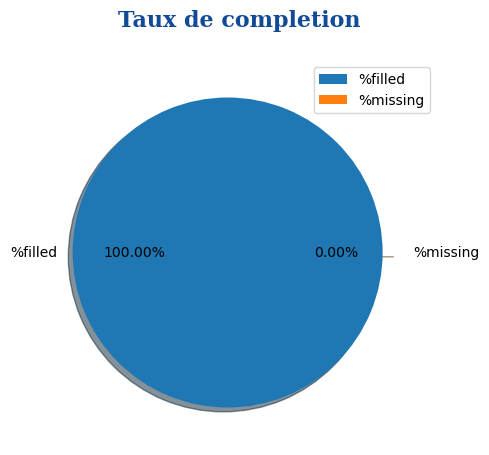

In [92]:
def fillingRate(data: pd.DataFrame, GRAPH_FOLDER, grahName: str = None):
    filled = data.notna().sum().sum() / (data.shape[0] * data.shape[1])
    missing = data.isna().sum().sum() / (data.shape[0] * data.shape[1])
    taux = [filled, missing]
    labels = ["%filled", "%missing"]
    explode = (0.1, 0)
    fig, ax = plt.subplots(figsize=(5, 5))
    plt.title("Taux de completion \n", fontdict=font_title)
    ax.axis("equal")
    ax.pie(taux, explode=explode, labels=labels, autopct='%1.2f%%', shadow=True, )
    plt.legend(labels)
    if grahName:
        plt.savefig(os_path_join(GRAPH_FOLDER, grahName), bbox_inches='tight')
    plt.show()
    plt.close()

fillingRate(train_df, GRAPH_FOLDER, grahName='completion_train_df.png')

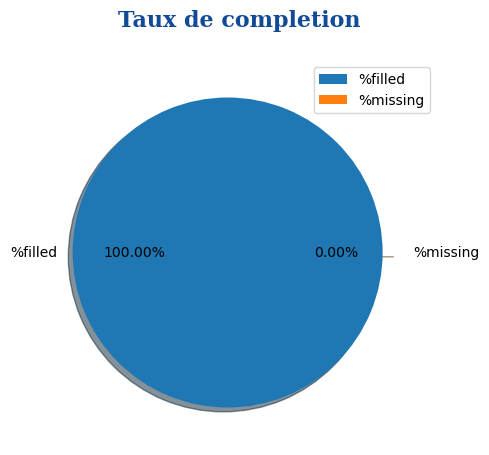

In [93]:
fillingRate(test_df, GRAPH_FOLDER, grahName='completion_test_df.png')

In [94]:
# Nous devons retirer les caractères spéciaux des noms des features pour l'utilisation de certains modèles (LightGBM)
# X=train_df.copy()
# y=target
import re
train_df = train_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_df  = test_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

def clean_feature_name(feature_name):
    # Remplacez tous les caractères non alphanumériques par des underscores
    cleaned_name = re.sub(r'[^a-zA-Z0-9_]', '_', feature_name)
    
    # Assurez-vous que le nom commence par une lettre ou un underscore
    if not re.match(r'^[a-zA-Z_]', cleaned_name):
        cleaned_name = '_' + cleaned_name
    
    return cleaned_name

### Selection de features

In [95]:
# train_df  = pd.read_csv(f'{OUT_FOLDER}/df_train.csv')
# test_df   = pd.read_csv(f'{OUT_FOLDER}/df_test.csv')
train_df.head()

,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,1,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,49.0,315.421053,5993.0,19.0
100003,0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,544.0,1385.320000,34633.0,25.0
100004,0,0,1,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,727.0,761.666667,2285.0,3.0
100006,0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,12.0,271.625000,4346.0,16.0
100007,0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,14.0,1032.242424,68128.0,66.0


In [96]:
MAX_FEATURES = 100

In [97]:
def create_X_y(df: pd.DataFrame):
    # df = df.set_index('SK_ID_CURR')
    target = df['TARGET'].copy()
    fields = df.drop(columns=['TARGET'])
    return fields, target


X, y = create_X_y(train_df)
print(X.shape)
print(y.shape)

(307507, 532)
(307507,)


In [98]:
X.reset_index().head()

,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,100002,0,0,0,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,49.0,315.421053,5993.0,19.0
1,100003,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,544.0,1385.320000,34633.0,25.0
2,100004,0,1,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,727.0,761.666667,2285.0,3.0
3,100006,1,0,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,12.0,271.625000,4346.0,16.0
4,100007,0,0,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,14.0,1032.242424,68128.0,66.0


In [99]:
# Split the data into train and test sets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

RANDOM_SEED       = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=RANDOM_SEED)
cols              = X_train.select_dtypes(['float64']).columns
X_train_std       = X_train.copy()
X_test_std        = X_test.copy()
scaler            = StandardScaler()

scaler.fit(X_train[cols])

X_train_std[cols] = scaler.transform(X_train[cols])
X_test_std[cols]  = scaler.transform(X_test[cols])

### Filter

documentation for SelectKBest: http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html

### 1.1 Pearson Correlation

Les filtres basés sur corrélation suppose un rélation linéaire entre les variables.

Comme il y a seulement 2 classes de cible (0 ou 1), on peut considerer la cible comme une variable ordinale, donc on peut utiliser la correlation avec la cible comme un indicateur d'importance du feature.

Note

- Normalization: no
- Impute missing values: yes


In [100]:
from scipy.stats import pearsonr
# X_train= X_train_copy
# X_train_copy = X_train.copy()
# X_train      = X_train[listvar]

def cor_selector(X_, y_):
    cor_list = []
    # calculate the correlation with y for each feature
    feature_names = X_.columns.tolist()
    for feature in feature_names:
        cor = np.corrcoef(X_[feature], y_)[0, 1]
        cor_list.append(cor)
    # replace NaN with 0
    cor_list = [0 if np.isnan(i) else i for i in cor_list]
    # feature name
    cor_feature = X_.iloc[:, np.argsort(
        np.abs(cor_list))[-MAX_FEATURES:]].columns.tolist()
    # feature selection? 0 for not select, 1 for select
    cor_support = [
        True if feature in cor_feature else False for feature in feature_names]
    return cor_support, cor_feature


with timer('Correlation'):
    cor_support, cor_feature = cor_selector(X_train, y_train)
print(str(len(cor_feature)), 'selected features')


C:\Users\Fane0763\.conda\envs\projet7\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning:

invalid value encountered in divide

C:\Users\Fane0763\.conda\envs\projet7\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning:

invalid value encountered in divide



Correlation - done in 3s
100 selected features


In [101]:
# import pandas as pd

# def low_variance_features(data, threshold=0.01):
#     """
#     Affiche les fonctionnalités avec une variance proche de zéro dans un jeu de données.

#     Args:
#         data (pd.DataFrame): Le jeu de données.
#         threshold (float): Le seuil de variance en dessous duquel une fonctionnalité est considérée comme ayant une faible variance.

#     Returns:
#         List[str]: Liste des noms des fonctionnalités avec une faible variance.
#     """
#     # Calculez la variance de chaque fonctionnalité
#     variances = data.var()

#     # Identifiez les fonctionnalités avec une variance inférieure au seuil
#     low_variance_features = variances[variances < threshold].index.tolist()

#     # Affichez les noms des fonctionnalités avec une faible variance
#     if low_variance_features:
#         print("Fonctionnalités avec une faible variance :")
#         # for feature in low_variance_features:
#         #     print(feature)
#     else:
#         print("Aucune fonctionnalité avec une faible variance trouvée.")

#     return low_variance_features

# low_variance_features = low_variance_features(X_train, threshold=0.01)

# listvar= list(set(X_train.columns)-set(low_variance_features))


# print('X_train : ', len(X_train.columns), 'low_variance_features:', len(low_variance_features), 'listvar :', len(listvar))

# X_train[listvar]

In [102]:
# cor_support
# cor_feature
X_train.isna().sum().sum()
y_train.isna().sum().sum()

0

### 1.2 SelectKBest

Note

- Normalization: MinMaxScaler (values should be bigger than 0)
- Impute missing values: yes

**Problem Type: Regression**

-----------------------------------
```python
from sklearn.feature_selection import SelectKBest, mutual_info_regression, f_regression
```
- [X] Data: **All Numerical**. ==> score_func        = **f_regression**
- [X] Data: **Mixed or Categorical**, ==> score_func = **mutual_info_regression**

**Problem Type: Classification.**

-----------------
```python
from sklearn.feature_selection import SelectKBest, chi2,mutual_info_classif, f_classif
```
- [X] Data: **Numerical**  ==> score_func    = **f_classif**
- [X] Data: **Mixed**. ==> score_func        = **mutual_info_classif**
- [X] Data: **Categorical**. ==> score_func  = **chi2**


In [103]:
from sklearn.feature_selection import SelectKBest, chi2,mutual_info_classif, f_classif
from sklearn.preprocessing import MinMaxScaler

chi_selector = SelectKBest(f_classif, k = MAX_FEATURES)
with timer('Chi_selector'):
    chi_selector.fit(X_train, y_train)
    
chi_support = chi_selector.get_support()
chi_feature = X_train.loc[:, chi_support].columns.tolist()
print(str(len(chi_feature)), 'selected features')


C:\Users\Fane0763\AppData\Roaming\Python\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning:

Features [395] are constant.

C:\Users\Fane0763\AppData\Roaming\Python\Python310\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning:

invalid value encountered in divide



Chi_selector - done in 6s
100 selected features


In [104]:
# from sklearn.feature_selection import SelectKBest
# from sklearn.feature_selection import f_classif
# selector = SelectKBest(score_func=f_classif, k=k)
# X_new = selector.fit_transform(X, y)
# selected_features = selector.get_support(indices=True)

### 2. Wrapper

documentation for RFE: http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

Note:

- Normalization: depend on the used model; yes for LR
- Impute missing values: depend on the used model; yes for LR

La ***RFE (Recursive Feature Elimination)*** est une technique de sélection de variables couramment utilisée dans le domaine de l'apprentissage automatique et de l'analyse de données pour choisir les caractéristiques les plus importantes ou les plus pertinentes d'un ensemble de données. Elle fonctionne en éliminant de ***manière récursive*** les caractéristiques les moins importantes du modèle, ce qui permet de réduire la dimensionnalité des données et d'améliorer les performances du modèle. Voici comment fonctionne la ***RFE***:

- [X] **Sélection initiale des caractéristique**s : Au début du processus, toutes les caractéristiques de l'ensemble de données sont incluses.

- [X] **Construction du modèle** : Un modèle d'apprentissage automatique est entraîné sur l'ensemble de données complet.

- [X] **Évaluation des caractéristiques** : Chaque caractéristique se voit attribuer un score d'importance en fonction de son impact sur les performances du modèle. Ce score dépend du type de modèle utilisé, mais il mesure généralement comment chaque caractéristique contribue à la capacité du modèle à faire des prédictions.

- [X] **Élimination des caractéristiques** : Les caractéristiques ayant les scores les plus bas sont éliminées de l'ensemble de données. Le nombre de caractéristiques à éliminer à chaque étape est défini à l'avance par l'utilisateur.

- [X] **Répétition du processus** : Les étapes 2 à 4 sont répétées de manière récursive jusqu'à ce qu'un critère d'arrêt soit atteint. Ce critère peut être un nombre fixe de caractéristiques à conserver ou une performance de modèle souhaitée.

- [X] **Caractéristiques sélectionnées** : Les caractéristiques qui restent après le processus de RFE sont considérées comme les caractéristiques les plus importantes ou les plus pertinentes pour le modèle.

In [105]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeClassifier

# Utilise un autre Classifier pour meilleur résultats
# On utilise RidgeClassifier ici pour vitesse, car RFE peut être très chronophage
rfe_selector = RFE(estimator=RidgeClassifier(alpha=2000),
                   n_features_to_select=MAX_FEATURES,
                   step=10, verbose=False)

with timer('Recursive Feature Elimination (RidgeClassifier)'):
    rfe_selector.fit(X_train, y_train)
    
rfe_support = rfe_selector.get_support()
rfe_feature = X_train.loc[:, rfe_support].columns.tolist()
print(str(len(rfe_feature)), 'selected features')


C:\Users\Fane0763\AppData\Roaming\Python\Python310\site-packages\sklearn\linear_model\_ridge.py:200: LinAlgWarning:

Ill-conditioned matrix (rcond=3.04034e-22): result may not be accurate.



Recursive Feature Elimination (RidgeClassifier) - done in 80s
100 selected features


### 3. Embedded

documentation for SelectFromModel: http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectFromModel.html

### 3.1 Logistics Regression L1

Note

- Normalization: Yes
- Impute missing values: Yes

La méthode **`SelectFromModel`** est un outil de sélection de variables en apprentissage automatique (machine learning) disponible dans la bibliothèque scikit-learn en Python. Elle permet de choisir un sous-ensemble de caractéristiques (variables ou attributs) à partir d'un modèle d'apprentissage automatique préalablement entraîné. L'idée derrière cette technique est de déterminer quelles caractéristiques sont les plus importantes ou les plus informatives pour le modèle et de ne conserver que celles-ci, ce qui peut améliorer les performances du modèle en réduisant la dimension de l'ensemble de données.

Voici comment fonctionne la sélection de variables avec **`SelectFromModel`** :

- [X] **Entraînement du modèle** : Tout d'abord, vous devez entraîner un modèle d'apprentissage automatique sur votre ensemble de données complet, y compris toutes les caractéristiques disponibles. Le modèle peut être n'importe quel modèle supervisé, comme une régression linéaire, une forêt aléatoire, un SVM (Support Vector Machine), etc.

- [X] **Importance des caractéristiques** : Une fois le modèle entraîné, `SelectFromModel` utilise une mesure d'importance des caractéristiques spécifique à ce modèle pour évaluer l'importance relative de chaque caractéristique dans la prise de décision du modèle. Par exemple, dans une forêt aléatoire, cette importance peut être mesurée par le gain d'information ou la diminution de l'impureté de Gini.

- [X] **Définition d'un seuil** : Vous devez spécifier un seuil d'importance en utilisant le paramètre `threshold` de `SelectFromModel`. Les caractéristiques dont l'importance est supérieure ou égale à ce seuil seront conservées, tandis que les autres seront éliminées.

- [X] **Sélection des caractéristiques** : `SelectFromModel` applique le seuil d'importance aux caractéristiques et crée un nouveau jeu de données contenant uniquement les caractéristiques qui ont passé le seuil.

In [106]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression

embedded_lr_selector = SelectFromModel(LogisticRegression(
    penalty='l1', solver='liblinear'), max_features=MAX_FEATURES)
with timer('LogisticRegression'):
    embedded_lr_selector.fit(X_train_std, y_train)
    
embedded_lr_support = embedded_lr_selector.get_support()
embedded_lr_feature = X_train_std.loc[:, embedded_lr_support].columns.tolist()
print(str(len(embedded_lr_feature)), 'selected features')


LogisticRegression - done in 1640s
100 selected features


### 3.2 Random Forest

Note

- Normalization: No
- Impute missing values: Yes


In [107]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

embedded_rf_selector = SelectFromModel(RandomForestClassifier(
    n_estimators=100), max_features = MAX_FEATURES)
with timer('Random Forest'):
    embedded_rf_selector.fit(X_train, y_train)
embedded_rf_support = embedded_rf_selector.get_support()
embedded_rf_feature = X_train.loc[:, embedded_rf_support].columns.tolist()
print(str(len(embedded_rf_feature)), 'selected features')


Random Forest - done in 939s
100 selected features


### 3.3 LightGBM

Note

- Normalization: No
- Impute missing values: No


In [108]:
from sklearn.feature_selection import SelectFromModel
from lightgbm import LGBMClassifier

lgbc = LGBMClassifier(n_estimators=500, learning_rate=0.05, num_leaves=32, colsample_bytree=0.2,
                      reg_alpha=3, reg_lambda=1, min_split_gain=0.01, min_child_weight=40)

embedded_lgb_selector = SelectFromModel(lgbc, max_features=MAX_FEATURES)
with timer('LightGBM'):
    embedded_lgb_selector.fit(X_train, y_train)
embedded_lgb_support = embedded_lgb_selector.get_support()
embedded_lgb_feature = X_train.loc[:, embedded_lgb_support].columns.tolist()
print(str(len(embedded_lgb_feature)), 'selected features')


[LightGBM] [Info] Number of positive: 19860, number of negative: 226145
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.177603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 59229
[LightGBM] [Info] Number of data points in the train set: 246005, number of used features: 510
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080730 -> initscore=-2.432469
[LightGBM] [Info] Start training from score -2.432469
LightGBM - done in 53s
100 selected features


## Comparaison des 100 'best' features selectionnés


In [109]:
pd.set_option('display.max_rows', None)
# put all selection together
feature_names = X_train.columns.tolist()
feature_selection_df = pd.DataFrame({'Feature': feature_names, 'Pearson': cor_support, 'Chi-2': chi_support, 'RFE': rfe_support, 'Logistics': embedded_lr_support,
                                    'Random Forest': embedded_rf_support, 'LightGBM': embedded_lgb_support})

# count the selected times for each feature
feature_selection_df['Total'] = np.sum(feature_selection_df.iloc[:,1:], axis=1)
# display the top 100
feature_selection_df = feature_selection_df.sort_values(
    ['Total', 'Feature'], ascending=False)
feature_selection_df.index = range(1, len(feature_selection_df)+1)
feature_selection_df.head(100)


,Feature,Pearson,Chi-2,RFE,Logistics,Random Forest,LightGBM,Total
1,EXT_SOURCE_3,True,True,True,True,True,True,6
2,EXT_SOURCE_2,True,True,True,True,True,True,6
3,PREV_APP_CREDIT_PERC_MEAN,True,True,True,False,True,True,5
4,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,True,True,False,True,True,True,5
5,DAYS_EMPLOYED_PERC,True,True,True,False,True,True,5
6,CODE_GENDER,True,True,True,True,False,True,5
7,APPROVED_DAYS_DECISION_MIN,True,True,False,True,True,True,5
8,APPROVED_AMT_ANNUITY_MEAN,True,True,False,True,True,True,5
9,AMT_GOODS_PRICE,True,True,False,True,True,True,5
10,AMT_CREDIT,True,True,False,True,True,True,5


## Drop colonnes qui ne sont pas dans les 100 'best' features


In [113]:
best_features = list(feature_selection_df['Feature'])[:MAX_FEATURES]
#if not 'SK_ID_CURR' in best_features:
#    best_features = ['SK_ID_CURR', *best_features]
new_columns = [*best_features, 'TARGET']
len(new_columns)

101

In [114]:
X.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       ...
       'INSTAL_AMT_INSTALMENT_MEAN', 'INSTAL_AMT_INSTALMENT_SUM',
       'INSTAL_AMT_PAYMENT_MIN', 'INSTAL_AMT_PAYMENT_MAX',
       'INSTAL_AMT_PAYMENT_MEAN', 'INSTAL_AMT_PAYMENT_SUM',
       'INSTAL_DAYS_ENTRY_PAYMENT_MAX', 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN',
       'INSTAL_DAYS_ENTRY_PAYMENT_SUM', 'INSTAL_COUNT'],
      dtype='object', length=532)

In [115]:
# on selectionne les best features pour un analyse des features seléctionnés

# df           = df[new_columns]
X            = X[best_features]
X_train      = X_train[best_features]
X_test       = X_test[best_features]
X_train_std  = X_train_std[best_features]
X_test_std   = X_test_std[best_features]

In [116]:
train_df     = train_df[new_columns]
test_df      = test_df[best_features]

In [117]:
# tester la presence de la variable ID dans le dataframe.
train_df.head()

,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,AMT_CREDIT,...,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN,TARGET
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,0.139376,0.262949,1.000000,315.421053,0.067329,0,606.0,9251.775,351000.0,406597.5,...,0,0,2,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1
100003,0.434471,0.622246,0.949329,1385.320000,0.070862,1,2341.0,56553.990,1129500.0,1293502.5,...,0,0,1,0.000000,0.333333,0.000000,0.666667,0.000000,0.333333,0
100004,0.729567,0.555912,1.207699,761.666667,0.011814,0,815.0,5357.250,135000.0,135000.0,...,0,0,2,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0
100006,0.693453,0.650442,1.010763,271.625000,0.159905,1,617.0,21842.190,297000.0,312682.5,...,0,0,2,0.111111,0.222222,0.555556,0.222222,0.111111,0.555556,0
100007,0.657340,0.322738,0.969650,1032.242424,0.152418,0,2357.0,12278.805,513000.0,513000.0,...,0,1,2,0.000000,0.000000,0.333333,0.333333,0.000000,0.166667,0


In [119]:
test_df.reset_index().head()

,SK_ID_CURR,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,...,AMT_ANNUITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN
0,100001,0.159520,0.789654,1.044079,2195.000000,0.121044,1,1740.0,3951.000,450000.0,...,20560.5,0,0,2,0.0,0.0,0.0,1.0,0.0,0.00
1,100005,0.432962,0.291656,1.111173,609.555556,0.247398,0,757.0,4813.200,180000.0,...,17370.0,0,0,2,0.0,0.0,1.0,0.5,0.0,0.50
2,100013,0.610991,0.699787,0.956503,1358.109677,0.222477,0,1999.0,11478.195,630000.0,...,69777.0,0,0,2,0.0,0.0,0.5,0.5,0.0,0.25
3,100028,0.612704,0.509677,0.777028,858.548673,0.133515,1,1805.0,8091.585,1575000.0,...,49018.5,0,0,2,0.0,0.0,0.8,0.4,0.2,0.40
4,100038,0.502739,0.425687,0.884003,634.250000,0.168021,0,821.0,11100.600,625500.0,...,32067.0,0,1,2,0.0,0.0,0.5,0.5,0.0,1.00


In [120]:
train_df.reset_index().head()

,SK_ID_CURR,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,...,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN,TARGET
0,100002,0.139376,0.262949,1.000000,315.421053,0.067329,0,606.0,9251.775,351000.0,...,0,0,2,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1
1,100003,0.434471,0.622246,0.949329,1385.320000,0.070862,1,2341.0,56553.990,1129500.0,...,0,0,1,0.000000,0.333333,0.000000,0.666667,0.000000,0.333333,0
2,100004,0.729567,0.555912,1.207699,761.666667,0.011814,0,815.0,5357.250,135000.0,...,0,0,2,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0
3,100006,0.693453,0.650442,1.010763,271.625000,0.159905,1,617.0,21842.190,297000.0,...,0,0,2,0.111111,0.222222,0.555556,0.222222,0.111111,0.555556,0
4,100007,0.657340,0.322738,0.969650,1032.242424,0.152418,0,2357.0,12278.805,513000.0,...,0,1,2,0.000000,0.000000,0.333333,0.333333,0.000000,0.166667,0


In [121]:
def display_shape(data_list: list, space=10):
    for df in data_list:
        print('{:{}}: {}'.format(namestr(df), space, df.shape))


data_list=[df, X, train_df, test_df, X_train, X_test, X_train_std, X_test_std]

display_shape(data_list, space=15)


# print(df.shape)
# print(X.shape)
# print(X_train.shape)
# print(X_test.shape)
# print(X_train_std.shape)
# print(X_test_std.shape)

df             : (356251, 770)
X              : (307507, 100)
train_df       : (307507, 101)
test_df        : (48744, 100)
X_train        : (246005, 100)
X_test         : (61502, 100)
X_train_std    : (246005, 100)
X_test_std     : (61502, 100)


In [122]:
X_train.reset_index().columns

Index(['SK_ID_CURR', 'EXT_SOURCE_3', 'EXT_SOURCE_2',
       'PREV_APP_CREDIT_PERC_MEAN', 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN',
       'DAYS_EMPLOYED_PERC', 'CODE_GENDER', 'APPROVED_DAYS_DECISION_MIN',
       'APPROVED_AMT_ANNUITY_MEAN', 'AMT_GOODS_PRICE',
       ...
       'AMT_ANNUITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_CITY_NOT_WORK_CITY',
       'REGION_RATING_CLIENT', 'PREV_PRODUCT_COMBINATION_CardStreet_MEAN',
       'PREV_NAME_YIELD_GROUP_low_normal_MEAN',
       'PREV_NAME_TYPE_SUITE_nan_MEAN', 'PREV_NAME_PORTFOLIO_POS_MEAN',
       'PREV_NAME_PORTFOLIO_Cards_MEAN', 'PREV_NAME_PAYMENT_TYPE_XNA_MEAN'],
      dtype='object', length=101)

#### Sauvegarde de la base

In [123]:
# train_df.to_csv(f'{OUT_FOLDER}/df_train.csv', index = False)
# test_df.to_csv(f'{OUT_FOLDER}/df_test.csv', index = False)

In [124]:
def sauvegarde_data(data, file_name, path=OUT_FOLDER,):
    savepath = f'{OUT_FOLDER}/{file_name}'
    print('saving data')
    with timer(f'Save to {savepath}'):
        data.to_csv(savepath, 
                    # index=False,
                   )
        
sauvegarde_data(train_df,     file_name = 'train_df.csv',    path=OUT_FOLDER,)
sauvegarde_data(test_df,      file_name = 'test_df.csv',     path=OUT_FOLDER,)

sauvegarde_data(X_train,      file_name = 'X_train.csv',     path=OUT_FOLDER,)
sauvegarde_data(X_test,       file_name = 'X_test.csv',      path=OUT_FOLDER,)

sauvegarde_data(X_train_std,  file_name = 'X_train_std.csv', path=OUT_FOLDER,)
sauvegarde_data(X_test_std,   file_name = 'X_test_std.csv',  path=OUT_FOLDER,)

saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/train_df.csv - done in 27s
saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/test_df.csv - done in 4s
saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/X_train.csv - done in 21s
saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/X_test.csv - done in 6s
saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/X_train_std.csv - done in 36s
saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/X_test_std.csv - done in 9s


In [125]:
sauvegarde_data(y_train,      file_name = 'y_train.csv',     path=OUT_FOLDER,)
sauvegarde_data(y_test,       file_name = 'y_test.csv',      path=OUT_FOLDER,)

saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/y_train.csv - done in 1s
saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/y_test.csv - done in 0s


In [126]:
if len(df_data) > SAMPLE_SIZE:
    samplepath = f'{OUT_FOLDER}/{CLEAN_DATA_SAMPLE}'
    if not os.path.exists(samplepath):
        with timer(f'Save sample (nb = {SAMPLE_SIZE}) to {samplepath}'):
            df_data.sample(SAMPLE_SIZE).to_csv(
                samplepath, index=False)


In [127]:
# for filename in [CLEAN_DATA_FILENAME, CLEAN_DATA_SAMPLE]:
#     filepath = f'{OUT_FOLDER}/{filename}'
#     print(f'file : {filename} : size={get_filesize(filepath)}')
display(train_df.reset_index().head())
display(test_df.reset_index().head())

,SK_ID_CURR,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,...,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN,TARGET
0,100002,0.139376,0.262949,1.000000,315.421053,0.067329,0,606.0,9251.775,351000.0,...,0,0,2,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1
1,100003,0.434471,0.622246,0.949329,1385.320000,0.070862,1,2341.0,56553.990,1129500.0,...,0,0,1,0.000000,0.333333,0.000000,0.666667,0.000000,0.333333,0
2,100004,0.729567,0.555912,1.207699,761.666667,0.011814,0,815.0,5357.250,135000.0,...,0,0,2,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0
3,100006,0.693453,0.650442,1.010763,271.625000,0.159905,1,617.0,21842.190,297000.0,...,0,0,2,0.111111,0.222222,0.555556,0.222222,0.111111,0.555556,0
4,100007,0.657340,0.322738,0.969650,1032.242424,0.152418,0,2357.0,12278.805,513000.0,...,0,1,2,0.000000,0.000000,0.333333,0.333333,0.000000,0.166667,0


,SK_ID_CURR,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,...,AMT_ANNUITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN
0,100001,0.159520,0.789654,1.044079,2195.000000,0.121044,1,1740.0,3951.000,450000.0,...,20560.5,0,0,2,0.0,0.0,0.0,1.0,0.0,0.00
1,100005,0.432962,0.291656,1.111173,609.555556,0.247398,0,757.0,4813.200,180000.0,...,17370.0,0,0,2,0.0,0.0,1.0,0.5,0.0,0.50
2,100013,0.610991,0.699787,0.956503,1358.109677,0.222477,0,1999.0,11478.195,630000.0,...,69777.0,0,0,2,0.0,0.0,0.5,0.5,0.0,0.25
3,100028,0.612704,0.509677,0.777028,858.548673,0.133515,1,1805.0,8091.585,1575000.0,...,49018.5,0,0,2,0.0,0.0,0.8,0.4,0.2,0.40
4,100038,0.502739,0.425687,0.884003,634.250000,0.168021,0,821.0,11100.600,625500.0,...,32067.0,0,1,2,0.0,0.0,0.5,0.5,0.0,1.00


In [128]:
sauvegarde_data(df,       file_name = 'df_merge.csv',      path=OUT_FOLDER,)

saving data
Save to C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put/df_merge.csv - done in 195s


In [132]:
data = load_csv('train_df.csv', None)
print(data.columns)
data.head()

Index(['SK_ID_CURR', 'EXT_SOURCE_3', 'EXT_SOURCE_2',
       'PREV_APP_CREDIT_PERC_MEAN', 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN',
       'DAYS_EMPLOYED_PERC', 'CODE_GENDER', 'APPROVED_DAYS_DECISION_MIN',
       'APPROVED_AMT_ANNUITY_MEAN', 'AMT_GOODS_PRICE',
       ...
       'REG_REGION_NOT_LIVE_REGION', 'REG_CITY_NOT_WORK_CITY',
       'REGION_RATING_CLIENT', 'PREV_PRODUCT_COMBINATION_CardStreet_MEAN',
       'PREV_NAME_YIELD_GROUP_low_normal_MEAN',
       'PREV_NAME_TYPE_SUITE_nan_MEAN', 'PREV_NAME_PORTFOLIO_POS_MEAN',
       'PREV_NAME_PORTFOLIO_Cards_MEAN', 'PREV_NAME_PAYMENT_TYPE_XNA_MEAN',
       'TARGET'],
      dtype='object', length=102)


,SK_ID_CURR,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,...,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN,TARGET
0,100002,0.139376,0.262949,1.000000,315.421053,0.067329,0,606.0,9251.775,351000.0,...,0,0,2,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1
1,100003,0.434471,0.622246,0.949329,1385.320000,0.070862,1,2341.0,56553.990,1129500.0,...,0,0,1,0.000000,0.333333,0.000000,0.666667,0.000000,0.333333,0
2,100004,0.729567,0.555912,1.207699,761.666667,0.011814,0,815.0,5357.250,135000.0,...,0,0,2,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0
3,100006,0.693453,0.650442,1.010763,271.625000,0.159905,1,617.0,21842.190,297000.0,...,0,0,2,0.111111,0.222222,0.555556,0.222222,0.111111,0.555556,0
4,100007,0.657340,0.322738,0.969650,1032.242424,0.152418,0,2357.0,12278.805,513000.0,...,0,1,2,0.000000,0.000000,0.333333,0.333333,0.000000,0.166667,0


In [131]:
data=pd.read_csv(f'{OUT_FOLDER}/test_df.csv').sort_values('SK_ID_CURR')

data.head()

,SK_ID_CURR,EXT_SOURCE_3,EXT_SOURCE_2,PREV_APP_CREDIT_PERC_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,DAYS_EMPLOYED_PERC,CODE_GENDER,APPROVED_DAYS_DECISION_MIN,APPROVED_AMT_ANNUITY_MEAN,AMT_GOODS_PRICE,...,AMT_ANNUITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_WORK_CITY,REGION_RATING_CLIENT,PREV_PRODUCT_COMBINATION_CardStreet_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_PORTFOLIO_POS_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,PREV_NAME_PAYMENT_TYPE_XNA_MEAN
0,100001,0.159520,0.789654,1.044079,2195.000000,0.121044,1,1740.0,3951.000,450000.0,...,20560.5,0,0,2,0.0,0.0,0.0,1.0,0.0,0.00
1,100005,0.432962,0.291656,1.111173,609.555556,0.247398,0,757.0,4813.200,180000.0,...,17370.0,0,0,2,0.0,0.0,1.0,0.5,0.0,0.50
2,100013,0.610991,0.699787,0.956503,1358.109677,0.222477,0,1999.0,11478.195,630000.0,...,69777.0,0,0,2,0.0,0.0,0.5,0.5,0.0,0.25
3,100028,0.612704,0.509677,0.777028,858.548673,0.133515,1,1805.0,8091.585,1575000.0,...,49018.5,0,0,2,0.0,0.0,0.8,0.4,0.2,0.40
4,100038,0.502739,0.425687,0.884003,634.250000,0.168021,0,821.0,11100.600,625500.0,...,32067.0,0,1,2,0.0,0.0,0.5,0.5,0.0,1.00
